<span style="color: lightblue"><font size="15">PREDICTION ANALYSIS</font></span>


In [30]:
import pandas as pd
import matplotlib.pyplot as plt

In [39]:
%config InlineBackend.figure_format='retina'

## Data statistics 
---

### function

In [31]:
def data_statistics(input_path, context_size, output_path=None, accuracy_prediction=False, precomputed=None):
    observations = pd.read_csv(input_path, sep=' ', header=None, names=['Context', 'Nucleotide'])
    observations = observations.sort_values(by='Context')
    #if context_size==1:
    #    observations['Context'] = observations['Context'].str[1]

    # Count the occurrences of each nucleotide for each context
    counts = observations.groupby('Context')['Nucleotide'].value_counts(normalize=True).unstack(fill_value=0) * 100
    #counts = counts.round(3)
    counts.reset_index()
    if output_path is not None:
        counts.to_csv(output_path, index=False)

    if accuracy_prediction:
        # Count the occurrences of each context
        context_counts = observations['Context'].value_counts().sort_index()
        total_contexts = len(observations)
        context_relative_freq = (context_counts / total_contexts * 100)#.round(3)
        
        # Identify the most likely nucleotide for each context
        most_likely_nucleotide = counts.idxmax(axis=1)
        
        # Combine all the information into a single DataFrame
        counts['Context_Count_Absolute'] = context_counts
        counts['Context_Count_Relative'] = context_relative_freq
        counts['Most_Likely_Nucleotide'] = most_likely_nucleotide
        counts['accuracy_most_likely']   = counts.apply(lambda row: row[row['Most_Likely_Nucleotide']], axis=1)
        
        # Reset index to make 'Context' a column
        counts.reset_index(inplace=True)
        #best_average_accuracy=((counts['accuracy_most_likely'].sum())/(pow(4, int(context_size)))).round(3)
        #print(f"The average best accuracy achievable with a {context_size} base context per base is: {best_average_accuracy}% \n")

        # Calculate the weighted sum over the accuracy_most_likely column using Context_Count_Relative
        best_accuracy = ((counts['accuracy_most_likely'] * counts['Context_Count_Relative']).sum()/100).round(3)
        print(f"The best accuracy achievable with a {context_size} base context is: {best_accuracy} % \n\n")

        if output_path is not None:
            counts.to_csv(output_path, index=False)
    return counts

## n gram calculation

###  new correct results

In [72]:
import os

for i in (1,3,5,7,9,15,31,63,127,255):
    file_path_train = f'../nanoGPT/data/genomic_char/architecture_nr_1_context_size_{i}/genomic_train_{i}.txt'
    output_train = f'../results/mutation_best_model_calc/train/train_data_n_gramms_size_{i}.csv'
    os.makedirs(os.path.dirname(output_train), exist_ok=True)
    data_statistics(file_path_train,i,output_path=output_train, accuracy_prediction=True)

The best accuracy achievable with a 1 base context is: 72.649 % 


The best accuracy achievable with a 3 base context is: 72.934 % 


The best accuracy achievable with a 5 base context is: 73.755 % 




KeyboardInterrupt: 

In [17]:
import os

for i in (1,3,5,7,9,15,31,63,127,255):
    file_path_test = f'../nanoGPT/data/genomic_char/architecture_nr_1_context_size_{i}/genomic_test_{i}.txt'
    output_test = f'../results/mutation_best_model_calc/test/test_data_n_gramms_size_{i}.csv'
    os.makedirs(os.path.dirname(output_test), exist_ok=True)
    data_statistics(file_path_test,i,output_path=output_test, accuracy_prediction=True)

The best accuracy achievable with a 1 base context is: 67.645 % 


The best accuracy achievable with a 3 base context is: 67.713 % 


The best accuracy achievable with a 5 base context is: 68.642 % 


The best accuracy achievable with a 7 base context is: 72.067 % 


The best accuracy achievable with a 9 base context is: 85.728 % 


The best accuracy achievable with a 15 base context is: 99.148 % 


The best accuracy achievable with a 31 base context is: 99.897 % 


The best accuracy achievable with a 63 base context is: 99.995 % 


The best accuracy achievable with a 127 base context is: 99.998 % 


The best accuracy achievable with a 255 base context is: 99.975 % 




In [42]:
import pandas as pd
import numpy as np

# Initialize an empty list to store the results
results = []

# Loop through the context sizes and calculate the accuracies
for i in (1,3,5,7,9,15,31,63): #,15,31,63,127,255):
    train = pd.read_csv(f'mutation_best_model_calc/train/train_data_n_gramms_size_{i}.csv')
    test  = pd.read_csv(f'mutation_best_model_calc/test/test_data_n_gramms_size_{i}.csv')
    #print(f'test has {len(test)} rows')
    #print(f'train has {len(train)} rows')
    non_matching_rows=0
    if 'Most_Likely_Nucleotide' in train.columns:
        # Create an empty column for accuracy_of_train_prediction
        test['accuracy_of_train_prediction'] = np.nan

        # Apply the lambda function only for valid indices
        for idx, row in train.iterrows():
            if row.name in test.index :#and row['Most_Likely_Nucleotide'] in test.columns:
                test.at[row.name, 'accuracy_of_train_prediction'] = test.at[row.name, row['Most_Likely_Nucleotide']]
           
        best_accuracy_on_matching_rows = ((test['accuracy_of_train_prediction'] * test['Context_Count_Relative']).sum() / 100).round(3)    
    
    accuracy_with_perfect_test = ((test['accuracy_most_likely'] * test['Context_Count_Relative']).sum() / 100).round(3)
   
    matching_row_perc=len(set(test['Context']) & set(train['Context']))/len(test)
    non_matching_row_perc=len(set(test['Context']) -set(train['Context']))/len(test)
    print('best_accuracy_on_matching_rows:',best_accuracy_on_matching_rows,'on',matching_row_perc)
    print('non_matching rows perc:',non_matching_row_perc)
    best_accuracy= matching_row_perc* best_accuracy_on_matching_rows + 0* non_matching_row_perc

    
    print(f'context size {i}: {best_accuracy} with train set knowledge, but with perfect test set knowledge',accuracy_with_perfect_test)
    results.append({'context_size': i, 'best_accuracy_train': best_accuracy, 'accuracy_with_perfect_test': accuracy_with_perfect_test})
    
# Create a DataFrame from the results
Basic_summary_train = pd.DataFrame(results)

# Save the DataFrame to a CSV file
Basic_summary_train.to_csv('mutation_best_model_calc/Basic_summary_train.csv', index=False)

best_accuracy_on_matching_rows: 67.645 on 1.0
non_matching rows perc: 0.0
context size 1: 67.645 with train set knowledge, but with perfect test set knowledge 67.645
best_accuracy_on_matching_rows: 66.857 on 1.0
non_matching rows perc: 0.0
context size 3: 66.857 with train set knowledge, but with perfect test set knowledge 67.713
best_accuracy_on_matching_rows: 67.895 on 1.0
non_matching rows perc: 0.0
context size 5: 67.895 with train set knowledge, but with perfect test set knowledge 68.642
best_accuracy_on_matching_rows: 33.369 on 0.9998623253252564
non_matching rows perc: 0.00013767467474358092
context size 7: 33.36440593377848 with train set knowledge, but with perfect test set knowledge 72.067
best_accuracy_on_matching_rows: 27.389 on 0.9901070721065617
non_matching rows perc: 0.00989292789343834
context size 9: 27.118042597926618 with train set knowledge, but with perfect test set knowledge 85.728
best_accuracy_on_matching_rows: 30.454 on 0.15271687689543936
non_matching rows pe

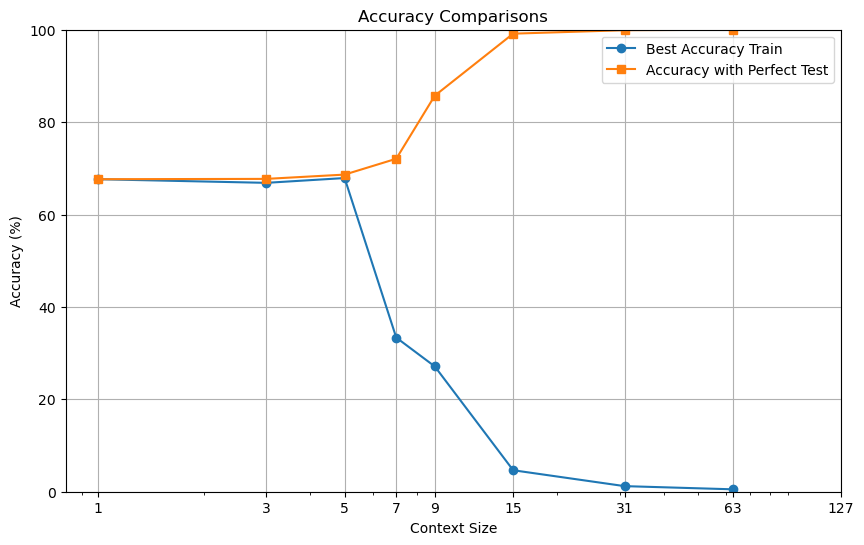

In [46]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming 'results' is a list of dictionaries and you convert it into a DataFrame
df = pd.read_csv('mutation_best_model_calc/Basic_summary_train.csv')

# Plotting the data
plt.figure(figsize=(10, 6))

# Plot 'best_accuracy_train'
plt.plot(df['context_size'], df['best_accuracy_train'], label='Best Accuracy Train', marker='o')

# Plot 'accuracy_with_perfect_test'
plt.plot(df['context_size'], df['accuracy_with_perfect_test'], label='Accuracy with Perfect Test', marker='s')

# Adding titles and labels
plt.title('Accuracy Comparisons')
plt.xlabel('Context Size')
plt.ylabel('Accuracy (%)')
plt.ylim(0,100)
plt.xscale('log')

plt.xticks([ 1,3,5, 7, 9 ,15, 31 ,63 ,127], labels=[1,3, 5, 7, 9 ,15, 31 ,63 ,127])



plt.legend()
plt.grid(True)

# Show the plot
plt.show()


### old results, irrelevant

In [13]:
file_path_test = '../nanoGPT/data/genomic_char/architecture_nr_1_context_size_3/genomic_test_3.txt'
#output_train= 'context_3/prediction_analysis/observed_context_counts_fromTrainSet.csv'
observed_counts_train = data_statistics(file_path_test,1, accuracy_prediction=True)
observed_counts_train.head(6)


The average best accuracy achievable with a 1 base context per base is: 60.433% 

The best accuracy achievable with a 1 base context is: 66.216 % 




Nucleotide,Context,A,C,G,T,Context_Count_Absolute,Context_Count_Relative,Most_Likely_Nucleotide,accuracy_most_likely
0,A,0.000000,20.982741,46.883516,32.133743,23119,14.199203,G,46.883516
1,C,18.765381,0.000000,6.995146,74.239472,58512,35.936838,T,74.239472
2,G,73.761981,7.179817,0.000000,19.058203,57592,35.371793,A,73.761981
3,T,32.111375,46.846923,21.041702,0.000000,23596,14.492166,C,46.846923


In [14]:
observed_counts_train = data_statistics(file_path_test,3, accuracy_prediction=True)

The average best accuracy achievable with a 3 base context per base is: 59.154% 

The best accuracy achievable with a 3 base context is: 66.216 % 




In [11]:
file_path_test = '../nanoGPT/data/genomic_char/architecture_nr_1_context_size_3/genomic_train_3.txt'
#output_train= 'context_3/prediction_analysis/observed_context_counts_fromTrainSet.csv'
observed_counts_train = data_statistics(file_path_test,1, accuracy_prediction=True)
observed_counts_train.head(6)


The average best accuracy achievable with a 1 base context per base is: 64.989% 

The best accuracy achievable with a 1 base context is: 72.358 % 




Nucleotide,Context,A,C,G,T,Context_Count_Absolute,Context_Count_Relative,Most_Likely_Nucleotide,accuracy_most_likely
0,A,0.000000,21.496103,48.609738,29.894159,731193,13.862774,G,48.609738
1,C,12.651038,0.000000,5.840685,81.508277,1905393,36.124571,T,81.508277
2,G,81.491260,5.807790,0.000000,12.700950,1908936,36.191743,A,81.491260
3,T,30.058643,48.346125,21.595232,0.000000,728985,13.820913,C,48.346125


#### context 3

In [45]:
 ####################### percentages from validation set #######################
file_path_val = '../nanoGPT/data/genomic_char/architecture_nr_1_context_size_3/genomic_val_context3.txt'
output_val= 'context_3/prediction_analysis/observed_context_counts_fromValSet.csv'
observed_counts_val = data_statistics(file_path_val,output_val)
observed_counts_val.head(6)

Nucleotide,A,C,G,T
Context,,,,
AAA,0.000,25.813,40.644,33.544
AAC,0.000,16.104,67.373,16.523
AAG,0.000,24.854,47.283,27.864
AAT,0.000,12.376,48.217,39.407
ACA,40.857,0.000,16.663,42.479
ACC,24.788,0.000,8.573,66.638


In [49]:
 ####################### percentages from training set #######################

In [8]:
observed_counts_train = data_statistics(file_path_train, 3,output_train, accuracy_prediction=True)


### cross calculation!!

The average best accuracy achievable with a 3 base context per base is: 62.988% 

The best accuracy achievable with a 3 base context is: 72.627 % 




In [7]:
file_path_train = '../nanoGPT/data/genomic_char/architecture_nr_1_context_size_3/genomic_train_3.txt'
#output_train= 'context_3/prediction_analysis/observed_context_counts_fromTrainSet.csv'
observed_counts_train = data_statistics(file_path_train,3)
observed_counts_train.head(6)

Nucleotide,A,C,G,T
Context,,,,
AAA,0.000000,29.339727,33.009061,37.651212
AAC,0.000000,26.079444,55.389685,18.530871
AAG,0.000000,40.942332,38.263176,20.794493
AAT,0.000000,16.692479,43.859674,39.447847
ACA,41.298683,0.000000,16.156423,42.544894
ACC,26.722147,0.000000,9.395380,63.882473


In [46]:
file_path_train = '../nanoGPT/data/genomic_char/architecture_nr_1_context_size_3/genomic_train_context3.txt'
output_train= 'context_3/prediction_analysis/observed_context_counts_fromTrainSet.csv'
observed_counts_train = data_statistics(file_path_train,output_train)
observed_counts_train.head(6)

Nucleotide,A,C,G,T
Context,,,,
AAA,0.000,29.217,34.074,36.708
AAC,0.000,25.575,55.794,18.631
AAG,0.000,40.359,38.445,21.196
AAT,0.000,16.514,44.334,39.152
ACA,40.814,0.000,15.869,43.317
ACC,27.968,0.000,9.719,62.313


In [70]:
observed_counts_train = data_statistics(file_path_train, 3,output_train, accuracy_prediction=True)
observed_counts_train.head(6)

The average best accuracy achievable with a 3 base context per base is: 62.769% 

The best accuracy achievable with a 3 base context is: 71.492 %


Nucleotide,Context,A,C,G,T,Context_Count_Absolute,Context_Count_Relative,Most_Likely_Nucleotide,accuracy_most_likely
0,AAA,0.000,29.217,34.074,36.708,94420,1.686,T,36.708
1,AAC,0.000,25.575,55.794,18.631,53760,0.960,G,55.794
2,AAG,0.000,40.359,38.445,21.196,94281,1.684,C,40.359
3,AAT,0.000,16.514,44.334,39.152,76997,1.375,G,44.334
4,ACA,40.814,0.000,15.869,43.317,63471,1.133,T,43.317
5,ACC,27.968,0.000,9.719,62.313,63143,1.128,T,62.313


In [28]:
file_path_val = '../nanoGPT/data/genomic_char/architecture_nr_1_context_size_3/genomic_val_context3.txt'
observed_counts_train = data_statistics(file_path_val, 3, accuracy_prediction=True)
observed_counts_train.head(6)

The average best accuracy achievable with a 3 base context per base is: 64.639% 

The best accuracy achievable with a 3 base context is: 75.165 % 




Nucleotide,Context,A,C,G,T,Context_Count_Absolute,Context_Count_Relative,Most_Likely_Nucleotide,accuracy_most_likely
0,AAA,0.000000,25.812559,40.643736,33.543705,6338,1.309696,G,40.643736
1,AAC,0.000000,16.104005,67.372615,16.523380,4769,0.985475,G,67.372615
2,AAG,0.000000,24.853679,47.282609,27.863712,4784,0.988575,G,47.282609
3,AAT,0.000000,12.375835,48.216903,39.407263,6141,1.268988,G,48.216903
4,ACA,40.857308,0.000000,16.663449,42.479243,5179,1.070198,T,42.479243
5,ACC,24.788207,0.000000,8.573365,66.638428,5902,1.219600,T,66.638428


#### context 1

In [77]:
observed_counts_1_train = data_statistics(file_path_train, 1 , accuracy_prediction=True)
observed_counts_1_train

The average best accuracy achievable with a 1 base context per base is: 64.618% 

The best accuracy achievable with a 1 base context is: 71.309 % 




Nucleotide,Context,A,C,G,T,Context_Count_Absolute,Context_Count_Relative,Most_Likely_Nucleotide,accuracy_most_likely
0,A,0.000,21.177,49.091,29.731,802434,14.329,G,49.091
1,C,13.542,0.000,6.177,80.281,1996792,35.656,T,80.281
2,G,80.268,6.144,0.000,13.588,1999963,35.712,A,80.268
3,T,29.907,48.830,21.263,0.000,800995,14.303,C,48.830


#### context 5

In [8]:
file_path_train = '../nanoGPT/data/genomic_char/architecture_nr_1_context_size_5/genomic_train_5.txt'
observed_counts_train_5 = data_statistics(file_path_train, 5 , accuracy_prediction=True)
observed_counts_train_5.head(6)

The average best accuracy achievable with a 5 base context per base is: 63.248% 

The best accuracy achievable with a 5 base context is: 73.748 % 




Nucleotide,Context,A,C,G,T,Context_Count_Absolute,Context_Count_Relative,Most_Likely_Nucleotide,accuracy_most_likely
0,AAAAA,0.0,25.480,36.585,37.936,18136,0.348,T,37.936
1,AAAAC,0.0,28.523,25.866,45.611,3839,0.074,T,45.611
2,AAAAG,0.0,25.238,34.405,40.357,5662,0.109,T,40.357
3,AAAAT,0.0,31.023,22.383,46.594,9954,0.191,T,46.594
4,AAACA,0.0,19.506,56.236,24.258,6398,0.123,G,56.236
5,AAACC,0.0,34.524,41.335,24.140,4478,0.086,G,41.335


In [34]:
file_path_train = '../nanoGPT/data/genomic_char/architecture_nr_1_context_size_5/genomic_train_5.txt'
observed_counts_train_5 = data_statistics(file_path_train, 5 , accuracy_prediction=True)
observed_counts_train_5.head(6)

The average best accuracy achievable with a 5 base context per base is: 63.248% 

The best accuracy achievable with a 5 base context is: 73.755 % 




Nucleotide,Context,A,C,G,T,Context_Count_Absolute,Context_Count_Relative,Most_Likely_Nucleotide,accuracy_most_likely
0,AAAAA,0.0,25.479709,36.584693,37.935598,18136,0.347772,T,37.935598
1,AAAAC,0.0,28.523053,25.866111,45.610836,3839,0.073616,T,45.610836
2,AAAAG,0.0,25.238432,34.404804,40.356764,5662,0.108573,T,40.356764
3,AAAAT,0.0,31.022704,22.382962,46.594334,9954,0.190876,T,46.594334
4,AAACA,0.0,19.506096,56.236324,24.257580,6398,0.122687,G,56.236324
5,AAACC,0.0,34.524341,41.335418,24.140241,4478,0.085869,G,41.335418


In [9]:
observed_counts_train.head(30)

Nucleotide,Context,A,C,G,T,Context_Count_Absolute,Context_Count_Relative,Most_Likely_Nucleotide,accuracy_most_likely
0,AAAAA,0.000,25.480,36.585,37.936,18136,0.348,T,37.936
1,AAAAC,0.000,28.523,25.866,45.611,3839,0.074,T,45.611
2,AAAAG,0.000,25.238,34.405,40.357,5662,0.109,T,40.357
3,AAAAT,0.000,31.023,22.383,46.594,9954,0.191,T,46.594
4,AAACA,0.000,19.506,56.236,24.258,6398,0.123,G,56.236
5,AAACC,0.000,34.524,41.335,24.140,4478,0.086,G,41.335
6,AAACG,0.000,19.444,54.167,26.389,432,0.008,G,54.167
7,AAACT,0.000,26.988,40.958,32.053,5469,0.105,G,40.958
8,AAAGA,0.000,28.177,43.013,28.810,9639,0.185,G,43.013
9,AAAGC,0.000,29.333,36.948,33.719,3375,0.065,G,36.948


#### context 7

In [10]:
file_path_train = '../nanoGPT/data/genomic_char/architecture_nr_1_context_size_7/genomic_train_7.txt'
observed_counts_train_7 = data_statistics(file_path_train, 7 , accuracy_prediction=True)
observed_counts_train_7.head(6)

The average best accuracy achievable with a 7 base context per base is: 63.806% 

The best accuracy achievable with a 7 base context is: 73.849 % 




Nucleotide,Context,A,C,G,T,Context_Count_Absolute,Context_Count_Relative,Most_Likely_Nucleotide,accuracy_most_likely
0,AAAAAAA,0.0,25.970,41.892,32.137,6827,0.131,G,41.892
1,AAAAAAC,0.0,33.026,28.879,38.095,651,0.012,T,38.095
2,AAAAAAG,0.0,13.904,48.940,37.156,1273,0.024,G,48.940
3,AAAAAAT,0.0,33.161,20.351,46.488,1936,0.037,T,46.488
4,AAAAACA,0.0,33.588,25.700,40.712,786,0.015,T,40.712
5,AAAAACC,0.0,28.662,25.159,46.178,314,0.006,T,46.178


In [ ]:
observed_counts_train_7.head(-30)

In [4]:
file_path_train = '../nanoGPT/data/genomic_char/architecture_nr_1_context_size_9/genomic_train_9.txt'
observed_counts_train_9 = data_statistics(file_path_train, 9 , accuracy_prediction=True)
observed_counts_train_9.head(6)

The average best accuracy achievable with a 9 base context per base is: 63.858% 

The best accuracy achievable with a 9 base context is: 75.67 % 




Nucleotide,Context,A,C,G,T,Context_Count_Absolute,Context_Count_Relative,Most_Likely_Nucleotide,accuracy_most_likely
0,AAAAAAAAA,0.0,24.347826,45.333333,30.318841,3450,0.066156,G,45.333333
1,AAAAAAAAC,0.0,30.612245,30.612245,38.775510,196,0.003758,T,38.775510
2,AAAAAAAAG,0.0,12.253521,68.169014,19.577465,710,0.013615,G,68.169014
3,AAAAAAAAT,0.0,30.627306,28.966790,40.405904,542,0.010393,T,40.405904
4,AAAAAAACA,0.0,39.790576,25.130890,35.078534,191,0.003663,C,39.790576
5,AAAAAAACC,0.0,30.882353,20.588235,48.529412,68,0.001304,T,48.529412


In [5]:
file_path_train = '../nanoGPT/data/genomic_char/architecture_nr_1_context_size_15/genomic_train_15.txt'
observed_counts_train_15 = data_statistics(file_path_train, 15 , accuracy_prediction=True)
observed_counts_train_15.head(6)

The average best accuracy achievable with a 15 base context per base is: 0.417% 

The best accuracy achievable with a 15 base context is: 97.392 % 




Nucleotide,Context,A,C,G,T,Context_Count_Absolute,Context_Count_Relative,Most_Likely_Nucleotide,accuracy_most_likely
0,AAAAAAAAAAAAAAA,0.0,24.690083,45.661157,29.648760,968,0.018562,G,45.661157
1,AAAAAAAAAAAAAAC,0.0,63.414634,17.073171,19.512195,41,0.000786,C,63.414634
2,AAAAAAAAAAAAAAG,0.0,9.042553,65.957447,25.000000,188,0.003605,G,65.957447
3,AAAAAAAAAAAAAAT,0.0,10.526316,29.824561,59.649123,57,0.001093,T,59.649123
4,AAAAAAAAAAAAACA,0.0,54.285714,22.857143,22.857143,35,0.000671,C,54.285714
5,AAAAAAAAAAAAACC,0.0,63.636364,27.272727,9.090909,11,0.000211,C,63.636364


In [7]:
observed_counts_train_15.to_csv('../nanoGPT/data/genomic_char/architecture_nr_1_context_size_15/statistics.csv', index=False)


#### other

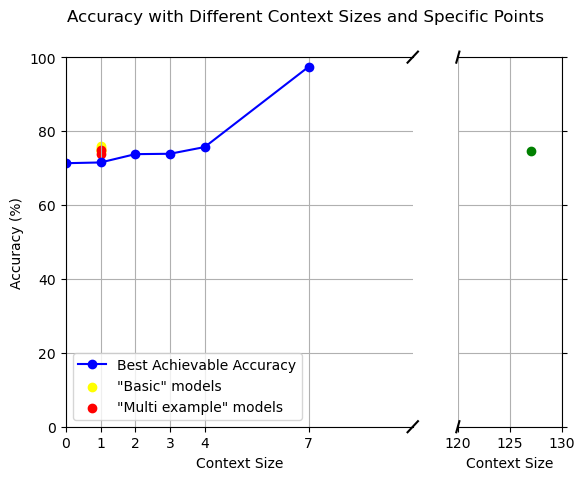

In [27]:
import matplotlib.pyplot as plt

# Data
context_sizes = [0, 1, 2, 3,4,7]
accuracies = [71.3, 71.5, 73.748, 73.849, 75.67, 97.4]

# Data points for x=1 in yellow
x1_yellow = [74.58, 74.58, 75.28, 75.06, 75.86]

# Data points for x=1 in red
x1_red = [73.82, 75.00]

# Data point for x=127 in green
x127_green = [74.50]

# Create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True, gridspec_kw={'width_ratios': [1, 0.3]})

# Plot the detailed view from 1 to 9
ax1.plot(context_sizes, accuracies, marker='o', linestyle='-', color='b', label='Best Achievable Accuracy')
ax1.scatter([1] * len(x1_yellow), x1_yellow, color='yellow', label='"Basic" models')
ax1.scatter([1] * len(x1_red), x1_red, color='red', label='"Multi example" models')
ax1.set_xlim(0.5, 10)
ax1.set_ylim(0, 100)
ax1.set_xlabel('Context Size')
ax1.set_xticks(context_sizes)

ax1.set_ylabel('Accuracy (%)')
ax1.legend()

# Plot the point at 127
ax2.scatter([127], x127_green, color='green', label='x=127 (Green)')
ax2.set_xlim(120, 130)
ax2.set_xlabel('Context Size')

# Set common properties
fig.suptitle('Accuracy with Different Context Sizes and Specific Points')
ax1.grid(True)
ax2.grid(True)

# Hide the spines between ax1 and ax2
ax1.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax1.yaxis.tick_left()
ax2.yaxis.tick_right()

# Add slashes to indicate the broken axis
d = .015  # how big to make the diagonal lines in axes coordinates
kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
ax1.plot((1-d, 1+d), (-d, +d), **kwargs)        # top-left diagonal
ax1.plot((1-d, 1+d), (1-d, 1+d), **kwargs)      # bottom-left diagonal

kwargs.update(transform=ax2.transAxes)  # switch to the right axes
ax2.plot((-d, +d), (1-d, 1+d), **kwargs)  # top-right diagonal
ax2.plot((-d, +d), (-d, +d), **kwargs)  # bottom-right diagonal

plt.show()


## analyse distribution

#### functions

In [32]:
import pandas as pd
import numpy as np

def reduce_to_3letters(df):
    # Function to extract the middle 3 bases
    def get_middle_3_bases(context):
        n = len(context)
        start = (n - 3) // 2
        return context[start:start + 3]
    
    df = df.round(3)
    df = df.reset_index()

    # Add a column for the middle 3 bases
    df['Context'] = df['Context'].apply(get_middle_3_bases)

    # Sort by the middle 3 bases
    df = df.sort_values(by='Context')

    # Initialize a dictionary to store the reduced data
    reduced_dict = {}
    nucleotides = ['A', 'C', 'G', 'T']

    # Initialize a DataFrame to store the results
    reduced_df = pd.DataFrame(columns=['Context'] + nucleotides)
    reduced_df['Context'] = df['Context'].unique()

    # Initialize empty lists in the DataFrame
    for nucleotide in nucleotides:
        reduced_df[nucleotide] = reduced_df['Context'].apply(lambda x: [])

    # Iterate through each row
    for _, row in df.iterrows():
        middle_3 = row['Context']

        for nucleotide in nucleotides:
            index = reduced_df.index[reduced_df['Context'] == middle_3].tolist()[0]
            reduced_df.at[index, nucleotide].append(row[nucleotide])

    # Set 'Context' as the index
    reduced_df.set_index('Context', inplace=True)
    reduced_df.columns.name = 'Nucleotide'

    return reduced_df

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import warnings

def actual_plotting_part_boxes(c_t_contexts_list, g_a_contexts_list, only_mutation, n_dfs, title, legend):
    
    # Function to plot boxplots for a given axis and DataFrame list
    def plot_boxplots(ax, dfs, colors_list):
        r = range(len(dfs[0]))  # Expanded range to accommodate all individual boxplots
        for i in range(len(dfs[0])):
            for j, df in enumerate(dfs):
                context = df.index[i]
                nucleotide = context.split('->')[1]
                data = df.iloc[i][nucleotide]
                box = ax.boxplot(data, positions=[i + j * 1], widths=1, patch_artist=True)

                for patch in box['boxes']:
                    patch.set_facecolor(colors_list[j][nucleotide])

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 8), sharex=False)
    
    colors_list_upper = [
        {'A': '#FFB3BA', 'T': '#FFDFBA', 'G': '#BAE1FF', 'C': '#BAFFC9'},  # Pastel
        {'A': '#FF0000', 'T': '#FFA500', 'G': '#0000FF', 'C': '#00FF00'},  # Bright
        {'A': '#8B0000', 'T': '#FF8C00', 'G': '#00008B', 'C': '#006400'}   # Dark
    ]
    colors_list_lower = [
        {'T': '#FFB3BA', 'A': '#FFDFBA', 'C': '#BAE1FF', 'G': '#BAFFC9'},  # Pastel
        {'T': '#FF0000', 'A': '#FFA500', 'C': '#0000FF', 'G': '#00FF00'},  # Bright
        {'T': '#8B0000', 'A': '#FF8C00', 'C': '#00008B', 'G': '#006400'}   # Dark
    ]

    # Plot the boxplots for each subplot
    plot_boxplots(ax1, c_t_contexts_list, colors_list_upper)
    plot_boxplots(ax2, g_a_contexts_list, colors_list_lower)
    
    # Customize x-axis
    c_t_labels = c_t_contexts_list[0].index
    g_a_labels = g_a_contexts_list[0].index
    
    if only_mutation:
        c_t_labels = [label for label in c_t_labels if label.split('->')[0][1] != label.split('->')[1]]
        g_a_labels = [label for label in g_a_labels if label.split('->')[0][1] != label.split('->')[1]]
    
    c_t_labels = [label.split('->')[0] for label in c_t_labels]
    g_a_labels = [label.split('->')[0] for label in g_a_labels]
    
    ax1.set_xticks(range(len(c_t_labels)))
    ax1.set_xticklabels(c_t_labels, rotation=90)
    
    ax2.set_xticks(range(len(g_a_labels)))
    ax2.set_xticklabels(g_a_labels, rotation=90)

    ax1.margins(x=0)
    ax2.margins(x=0)
    
    # Set labels and titles
    ax1.set_ylabel('Probability')
    ax2.set_ylabel('Probability')
    ax1.set_title(f"{title}: Contexts (C/T)")
    ax2.set_title(f"{title}: Complement Contexts (G/A)")
    
    # Add boxes with specified text at the top of the figure
    labels_1 = ["C-->A", "C-->C", "C-->G", "C-->T", "T-->A", "T-->C", "T-->G", "T-->T"]  \
                if not only_mutation else ["C-->A", "C-->G", "C-->T", "T-->A", "T-->C", "T-->G"]
    labels_2 = ["G-->T", "G-->G", "G-->C", "G-->A", "A-->T", "A-->G", "A-->C", "A-->A"]   \
                if not only_mutation else ["G-->T", "G-->C", "G-->A", "A-->T", "A-->G", "A-->C"]
    
    # Suppress UserWarning
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", UserWarning)
        for i in range(len(labels_1)):
            x_pos = i * (len(c_t_labels) / len(labels_1))
            
            rect = Rectangle((x_pos, ax1.get_ylim()[1]), len(c_t_labels) / len(labels_1), 0.1, transform=ax1.get_xaxis_transform(), color='none', edgecolor='black')
            ax1.add_patch(rect)
            ax1.text(x_pos + (len(c_t_labels) / (2 * len(labels_1))), ax1.get_ylim()[1] - 5, labels_1[i], ha='center', va='top', fontsize=14, fontweight='bold')
            
            rect = Rectangle((x_pos, ax2.get_ylim()[1]), len(g_a_labels) / len(labels_2), 0.1, transform=ax2.get_xaxis_transform(), color='none', edgecolor='black')
            ax2.add_patch(rect)
            ax2.text(x_pos + (len(g_a_labels) / (2 * len(labels_2))), ax2.get_ylim()[1] - 5, labels_2[i], ha='center', va='top', fontsize=14, fontweight='bold')

    handles = [Rectangle((0, 0), 1, 1, color=colors_list_upper[j]['A']) for j in range(n_dfs)]  # Color doesn't matter
    ax1.legend(handles, legend, loc='center right', bbox_to_anchor=(1, 0.75))
    
    plt.xlabel('Context')
    plt.tight_layout()
    plt.show()


import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import warnings

def plot_boxplots(dfs, title, legend=None, only_mutation=False):
    
    def expand_df(df):
        expanded_rows = []
        for context, row in df.iterrows():
            for nucleotide in ['A', 'C', 'G', 'T']:
                new_context = f"{context}->{nucleotide}"
                new_row = row.copy()
                new_row.name = new_context
                expanded_rows.append(new_row)
        expanded_df = pd.DataFrame(expanded_rows)
        return expanded_df

    # Create sorting key
    def sorting_key(row, base_type):
        context  = row.name.split('->')[0]
        mutation = row.name.split('->')[1]

        if base_type == 'pyrim':     
            first_base  = context[0]
            middle_base = context[1]
            third_base  = context[2]
        elif base_type == 'purin':
            complement = {'A': 'T', 'T': 'A', 'C': 'G', 'G': 'C'}
            first_base    = complement[context[2]]
            middle_base   = complement[context[1]]
            third_base    = complement[context[0]]

        order_usual  = 'ACGT'        
        order_middle = 'CTGA'
        mutation_index = order_usual.index(mutation) if base_type == 'pyrim' else order_usual.index(complement[mutation]) 
        middle_index   = order_middle.index(middle_base)  
        first_index    = order_usual.index(first_base)
        third_index    = order_usual.index(third_base)

        return (middle_index, mutation_index, first_index, third_index)

    ############## function start ##############

    if not isinstance(dfs, list):  
        dfs = [dfs]
    n_dfs = len(dfs)
    expanded_dfs = [expand_df(df) for df in dfs]

    with warnings.catch_warnings():
        warnings.simplefilter(action='ignore', category=pd.errors.SettingWithCopyWarning)
        for expanded_df in expanded_dfs:
            expanded_df['Sorting_Key'] = expanded_df.apply(sorting_key, axis=1, args=('pyrim',))
            expanded_df.sort_values(by='Sorting_Key', inplace=True)
            expanded_df.drop(columns=['Sorting_Key'], inplace=True)
        
        c_t_contexts_list = [expanded_df[expanded_df.index.to_series().apply(lambda x: x.split('->')[0][1]).isin(['C', 'T'])] for expanded_df in expanded_dfs]
        g_a_contexts_list = [expanded_df[expanded_df.index.to_series().apply(lambda x: x.split('->')[0][1]).isin(['G', 'A'])] for expanded_df in expanded_dfs]
    
        for expanded_df in g_a_contexts_list:
            expanded_df['Sorting_Key'] = expanded_df.apply(sorting_key, axis=1, args=('purin',))
            expanded_df.sort_values(by='Sorting_Key', inplace=True)
            expanded_df.drop(columns=['Sorting_Key'], inplace=True)
    
    if only_mutation:
        c_t_contexts_list = [df[~df.index.to_series().apply(lambda x: x.split('->')[0][1] == x.split('->')[1])] for df in c_t_contexts_list]
        g_a_contexts_list = [df[~df.index.to_series().apply(lambda x: x.split('->')[0][1] == x.split('->')[1])] for df in g_a_contexts_list]

    #return expanded_df
    ##### Set up the plot
    actual_plotting_part_boxes(c_t_contexts_list, g_a_contexts_list, only_mutation, n_dfs, title, legend)



#### results

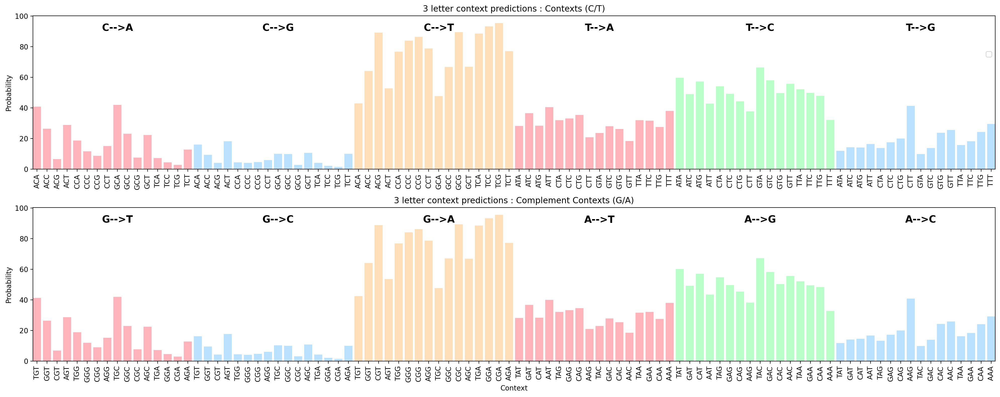

In [41]:
file_path_train = '../nanoGPT/data/genomic_char/architecture_nr_1_context_size_3/genomic_train_3.txt'
observed_counts_train_3 = data_statistics(file_path_train, 3 , accuracy_prediction=False)
plot_reordered_df_multi(observed_counts_train_3, "3 letter context predictions ", only_mutation=True, legend ="")

In [ ]:
file_path_train = '../nanoGPT/data/genomic_char/architecture_nr_1_context_size_5/genomic_train_5.txt'
observed_counts_train_5 = data_statistics(file_path_train, 5 , accuracy_prediction=False)
observed_counts_train_5.head(6)

In [77]:
path='../results/all_results_by_model/model_A802___with_architecture1_context_3/prediction_probabilities_model_A802.csv'
df=data_statistics(path,3)
plot_boxplots(df, "5 letter contexts as boxplots ", only_mutation=True, legend ="")

ValueError: Cannot set a DataFrame without columns to the column Sorting_Key

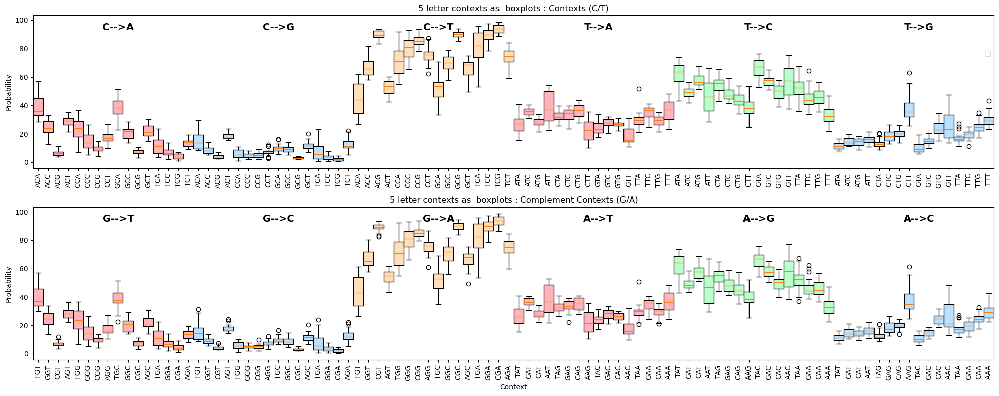

In [102]:
result = reduce_to_3letters(observed_counts_train_5)
plot_boxplots(result, "5 letter contexts as boxplots ", only_mutation=True, legend ="")

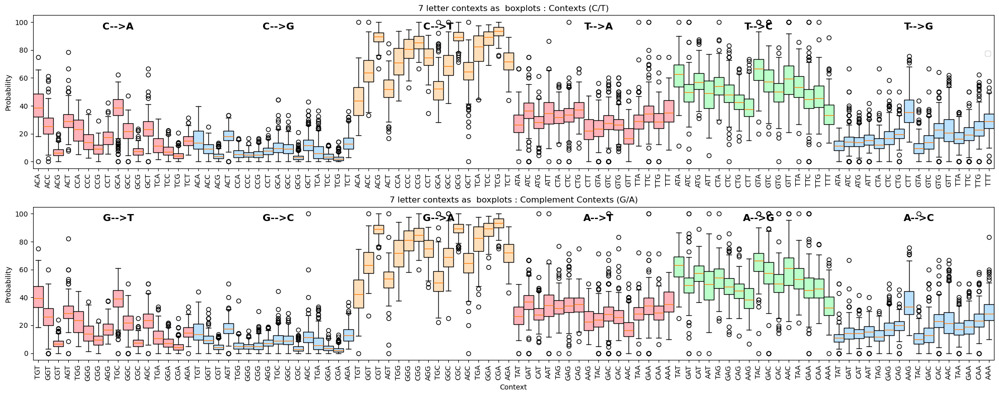

In [35]:
file_path_train = '../nanoGPT/data/genomic_char/architecture_nr_1_context_size_7/genomic_train_7.txt'
observed_counts_train_7 = data_statistics(file_path_train, 7 , accuracy_prediction=False)
result = reduce_to_3letters(observed_counts_train_7)
plot_boxplots(result, "7 letter contexts as  boxplots ", only_mutation=True, legend ="")

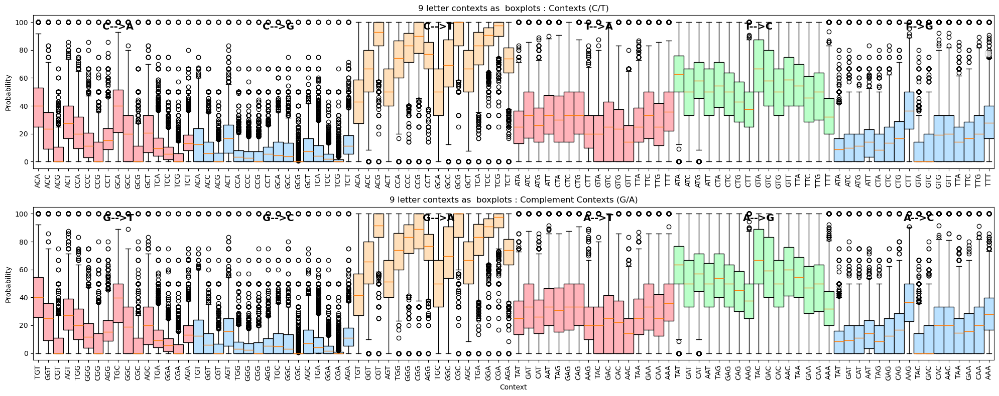

In [104]:
file_path_train = '../nanoGPT/data/genomic_char/architecture_nr_1_context_size_9/genomic_train_9.txt'
observed_counts_train_9 = data_statistics(file_path_train, 9 , accuracy_prediction=False)
result = reduce_to_3letters(observed_counts_train_9)
plot_boxplots(result, "9 letter contexts as  boxplots ", only_mutation=True, legend ="")

##### old

IndexError: string index out of range

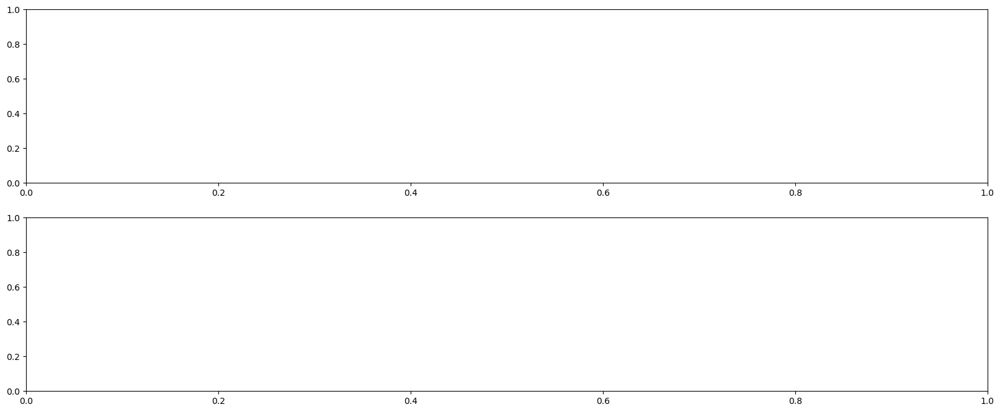

In [101]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns
import warnings

def plot_with_mini_boxplots(reduced_dict, title, legend=None):
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 8), sharex=False)

    # Define colors for nucleotides
    colors = {
        'A': 'red',
        'C': 'blue',
        'G': 'green',
        'T': 'orange'
    }

    def plot_boxplots(ax, contexts, colors):
        for idx, (context, nucleotides) in enumerate(contexts.items()):
            for nucleotide, values in nucleotides.items():
                # Mini boxplot for each bar
                sns.boxplot(x=[idx] * len(values), y=values, ax=ax, width=0.2, color=colors[nucleotide])
                # Mean point
                mean_value = pd.Series(values).mean()
                ax.plot(idx, mean_value, 'o', color='black')

    # Define the nucleotide contexts for each subplot
    c_t_contexts = {k: v for k, v in reduced_dict.items() if k[1] in 'CT'}
    g_a_contexts = {k: v for k, v in reduced_dict.items() if k[1] in 'GA'}

    # Plot the mini boxplots for each subplot
    plot_boxplots(ax1, c_t_contexts, colors)
    plot_boxplots(ax2, g_a_contexts, colors)

    # Customize x-axis
    ax1.set_xticks(range(len(c_t_contexts)))
    ax1.set_xticklabels(list(c_t_contexts.keys()), rotation=90)
    
    ax2.set_xticks(range(len(g_a_contexts)))
    ax2.set_xticklabels(list(g_a_contexts.keys()), rotation=90)

    ax1.margins(x=0)
    ax2.margins(x=0)
    
    # Set labels and titles
    ax1.set_ylabel('Probability')
    ax2.set_ylabel('Probability')
    ax1.set_title(f"{title}: Contexts (C/T)")
    ax2.set_title(f"{title}: Complement Contexts (G/A)")
    
    # Add legend
    handles = [plt.Rectangle((0, 0), 1, 1, color=colors[nucleotide]) for nucleotide in colors]
    ax1.legend(handles, colors.keys(), loc='center right', bbox_to_anchor=(1, 0.75))
    
    plt.xlabel('Context')
    plt.tight_layout()
    plt.show()

def expand_df(df):
    expanded_rows = []
    for context, row in df.iterrows():
        for nucleotide in ['A', 'C', 'G', 'T']:
            new_context = f"{context}->{nucleotide}"
            new_row = row.copy()
            new_row.name = new_context
            expanded_rows.append(new_row)
    expanded_df = pd.DataFrame(expanded_rows)
    return expanded_df

def sorting_key(row, base_type):
    context = row.name.split('->')[0]
    mutation = row.name.split('->')[1]

    if base_type == 'pyrim':     
        first_base = context[0]
        middle_base = context[1]
        third_base = context[2]
    elif base_type == 'purin':
        complement = {'A': 'T', 'T': 'A', 'C': 'G', 'G': 'C'}
        first_base = complement[context[2]]
        middle_base = complement[context[1]]
        third_base = complement[context[0]]

    order_usual = 'ACGT'        
    order_middle = 'CTGA'
    mutation_index = order_usual.index(mutation) if base_type == 'pyrim' else order_usual.index(complement[mutation])
    middle_index = order_middle.index(middle_base)
    first_index = order_usual.index(first_base)
    third_index = order_usual.index(third_base)

    return (middle_index, mutation_index, first_index, third_index)

def actual_plotting_part(c_t_contexts_list, g_a_contexts_list, only_mutation, n_dfs, title, legend):
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 8), sharex=False)

    colors_list_upper = [
        {'A': '#FFB3BA', 'T': '#FFDFBA', 'G': '#BAE1FF', 'C': '#BAFFC9'},  # Pastel
        {'A': '#FF0000', 'T': '#FFA500', 'G': '#0000FF', 'C': '#00FF00'},  # Bright
        {'A': '#8B0000', 'T': '#FF8C00', 'G': '#00008B', 'C': '#006400'}   # Dark
    ]
    colors_list_lower = [
        {'T': '#FFB3BA', 'A': '#FFDFBA', 'C': '#BAE1FF', 'G': '#BAFFC9'},  # Pastel
        {'T': '#FF0000', 'A': '#FFA500', 'C': '#0000FF', 'G': '#00FF00'},  # Bright
        {'T': '#8B0000', 'A': '#FF8C00', 'C': '#00008B', 'G': '#006400'}   # Dark
    ]
    
    def plot_bars(ax, dfs, colors_list):
        r = range(len(dfs[0]))  # Expanded range to accommodate all individual bars
        for i in range(len(dfs[0])):
            for j, df in enumerate(dfs):
                context = df.index[i]
                row = df.iloc[i]
                nucleotide = context.split('->')[1]
                ax.bar(i + j * bar_width, row[nucleotide], color=colors_list[j][nucleotide], width=bar_width)
    
    # Bar width
    bar_width = 0.8 / n_dfs
    
    # Plot the bars for each subplot
    plot_bars(ax1, c_t_contexts_list, colors_list_upper)
    plot_bars(ax2, g_a_contexts_list, colors_list_lower)
    
    # Customize x-axis
    c_t_labels = c_t_contexts_list[0].index
    g_a_labels = g_a_contexts_list[0].index
    
    if only_mutation:
        c_t_labels = [label for label in c_t_labels if label.split('->')[0][1] != label.split('->')[1]]
        g_a_labels = [label for label in g_a_labels if label.split('->')[0][1] != label.split('->')[1]]
    
    c_t_labels = [label.split('->')[0] for label in c_t_labels]
    g_a_labels = [label.split('->')[0] for label in g_a_labels]
    
    ax1.set_xticks(range(len(c_t_labels)))
    ax1.set_xticklabels(c_t_labels, rotation=90)
    
    ax2.set_xticks(range(len(g_a_labels)))
    ax2.set_xticklabels(g_a_labels, rotation=90)

    ax1.margins(x=0)
    ax2.margins(x=0)
    
    # Set labels and titles
    ax1.set_ylabel('Probability')
    ax2.set_ylabel('Probability')
    ax1.set_title(f"{title}: Contexts (C/T)")
    ax2.set_title(f"{title}: Complement Contexts (G/A)")
    
    # Add boxes with specified text at the top of the figure
    labels_1 = ["C-->A", "C-->C", "C-->G", "C-->T", "T-->A", "T-->C", "T-->G", "T-->T"]  \
                if not only_mutation else ["C-->A", "C-->G", "C-->T", "T-->A", "T-->C", "T-->G"]
    labels_2 = ["G-->T", "G-->G", "G-->C", "G-->A", "A-->T", "A-->G", "A-->C", "A-->A"]   \
                if not only_mutation else ["G-->T", "G-->C", "G-->A", "A-->T", "A-->G", "A-->C"]
    
    # Suppress UserWarning
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", UserWarning)
        for i in range(len(labels_1)):
            x_pos = i * (len(c_t_labels) / len(labels_1))
            
            rect = Rectangle((x_pos, ax1.get_ylim()[1]), len(c_t_labels) / len(labels_1), 0.1, transform=ax1.get_xaxis_transform(), color='none', edgecolor='black')
            ax1.add_patch(rect)
            ax1.text(x_pos + (len(c_t_labels) / (2 * len(labels_1))), ax1.get_ylim()[1] - 5, labels_1[i], ha='center', va='top', fontsize=14, fontweight='bold')
            rect = Rectangle((x_pos, ax2.get_ylim()[1]), len(g_a_labels) / len(labels_2), 0.1, transform=ax2.get_xaxis_transform(), color='none', edgecolor='black')
            ax2.add_patch(rect)
            ax2.text(x_pos + (len(g_a_labels) / (2 * len(labels_2))), ax2.get_ylim()[1] - 5, labels_2[i], ha='center', va='top', fontsize=14, fontweight='bold')

    handles = [Rectangle((0, 0), 1, 1, color=colors_list_upper[j]['A']) for j in range(n_dfs)]  # Color doesn't matter
    ax1.legend(handles, legend, loc='center right', bbox_to_anchor=(1, 0.75))
    
    plt.xlabel('Context')
    plt.tight_layout()
    plt.show()

def plot_reordered_df_multi(dfs, title, legend=None, only_mutation=Trie\\):
    def expand_df(df):
        expanded_rows = []
        for context, row in df.iterrows():
            for nucleotide in ['A', 'C', 'G', 'T']:
                new_context = f"{context}->{nucleotide}"
                new_row = row.copy()
                new_row.name = new_context
                expanded_rows.append(new_row)
        expanded_df = pd.DataFrame(expanded_rows)
        return expanded_df

    def sorting_key(row, base_type):
        context = row.name.split('->')[0]
        mutation = row.name.split('->')[1]

        if base_type == 'pyrim':     
            first_base = context[0]
            middle_base = context[1]
            third_base = context[2]
        elif base_type == 'purin':
            complement = {'A': 'T', 'T': 'A', 'C': 'G', 'G': 'C'}
            first_base = complement[context[2]]
            middle_base = complement[context[1]]
            third_base = complement[context[0]]

        order_usual = 'ACGT'        
        order_middle = 'CTGA'
        mutation_index = order_usual.index(mutation) if base_type == 'pyrim' else order_usual.index(complement[mutation])
        middle_index = order_middle.index(middle_base)
        first_index = order_usual.index(first_base)
        third_index = order_usual.index(third_base)

        return (middle_index, mutation_index, first_index, third_index)

    if not isinstance(dfs, list):  
        dfs = [dfs]
    n_dfs = len(dfs)
    expanded_dfs = [expand_df(df) for df in dfs]

    with warnings.catch_warnings():
        warnings.simplefilter(action='ignore', category=pd.errors.SettingWithCopyWarning)
        for expanded_df in expanded_dfs:
            expanded_df['Sorting_Key'] = expanded_df.apply(sorting_key, axis=1, args=('pyrim',))
            expanded_df.sort_values(by='Sorting_Key', inplace=True)
            expanded_df.drop(columns=['Sorting_Key'], inplace=True)
        
        c_t_contexts_list = [expanded_df[expanded_df.index.to_series().apply(lambda x: x.split('->')[0][1]).isin(['C', 'T'])] for expanded_df in expanded_dfs]
        g_a_contexts_list = [expanded_df[expanded_df.index.to_series().apply(lambda x: x.split('->')[0][1]).isin(['G', 'A'])] for expanded_df in expanded_dfs]
    
        for expanded_df in g_a_contexts_list:
            expanded_df['Sorting_Key'] = expanded_df.apply(sorting_key, axis=1, args=('purin',))
            expanded_df.sort_values(by='Sorting_Key', inplace=True)
            expanded_df.drop(columns=['Sorting_Key'], inplace=True)
    
    if only_mutation:
        c_t_contexts_list = [df[~df.index.to_series().apply(lambda x: x.split('->')[0][1] == x.split('->')[1])] for df in c_t_contexts_list]
        g_a_contexts_list = [df[~df.index.to_series().apply(lambda x: x.split('->')[0][1] == x.split('->')[1])] for df in g_a_contexts_list]

    actual_plotting_part(c_t_contexts_list, g_a_contexts_list, only_mutation, n_dfs, title, legend)

# Example usage:
# Create a dummy DataFrame for testing
data = {
    'Context': ['AAA', 'AAC', 'AAG', 'AAT', 'ACA', 'ACC', 'ACG', 'ACT'],
    'A': [0.1, 0.2, 0.3, 0.4, 0.2, 0.1, 0.3, 0.2],
    'C': [0.4, 0.3, 0.2, 0.1, 0.1, 0.4, 0.3, 0.2],
    'G': [0.3, 0.2, 0.1, 0.2, 0.3, 0.2, 0.1, 0.4],
    'T': [0.2, 0.3, 0.4, 0.3, 0.4, 0.3, 0.4, 0.2]
}
df = pd.DataFrame(data)
df.set_index('Context', inplace=True)

# Create a reduced dictionary from the DataFrame
reduced_dict = {}
for index, row in df.iterrows():
    reduced_dict[index] = {nucleotide: [row[nucleotide]] for nucleotide in ['A', 'C', 'G', 'T']}

plot_with_mini_boxplots(result, "Title", ["Legend"])


#  <span style="color: purple;"> *functions*</span>
---

###  <span style="color: purple;"> *assert_mutations*</span>


In [43]:
def assert_mutations(df):
    matches = []
    for index, row in df.iterrows():
        middle_nucleotide = index[len(index) // 2]  # Get the middle nucleotide of the context
        if middle_nucleotide in df.columns:
            matches.append(row[middle_nucleotide])
        # Get the highest number among the matches
    print("\n The maximum probability of a non-mutation prediction (i.e. A to A, as not found in the training data) is:", max(matches), '% \n')

###  <span style="color: purple;"> *reorder_df*</span>


In [44]:
def reorder_df(df):
    def sorting_key(context):
        middle_base = context[1]
        first_base = context[0]
        third_base = context[2]
        
        order_middle = 'CTGA'
        order_first_ct = 'ACGT'
        order_first_ga = 'TGCA'
        order_third_ct = 'ACGT'
        order_third_ga = 'TGCA'
        
        middle_index = order_middle.index(middle_base)
        
        if middle_base in 'CT':
            first_index = order_first_ct.index(first_base)
            third_index = order_third_ct.index(third_base)
        else:
            first_index = order_first_ga.index(first_base)
            third_index = order_third_ga.index(third_base)
        
        return (middle_index, first_index, third_index)
    
    # Apply the sorting key function to create sorting criteria
    df['Sorting_Key'] = df.index.to_series().apply(sorting_key)
    
    # Sort by the sorting criteria
    df = df.sort_values(by='Sorting_Key')
    
    # Drop the temporary sorting key column
    df = df.drop(columns=['Sorting_Key'])
    
    return df

##  <span style="color: purple;"> *Plotting*</span>
---

###  <span style="color: purple;"> *old*</span>


In [37]:
"""
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import warnings

def get_complement(seq):
    complement = {'A': 'T', 'T': 'A', 'C': 'G', 'G': 'C'}
    return ''.join([complement[base] for base in seq])

def plot_reordered_df(df, title, only_mutation=False):
    # Create a new DataFrame that includes the mutation nucleotide
    expanded_rows = []
    for context, row in df.iterrows():
        for nucleotide in ['A', 'C', 'G', 'T']:
            new_context = f"{context}->{nucleotide}"
            new_row = row.copy()
            new_row.name = new_context
            expanded_rows.append(new_row)
    expanded_df = pd.DataFrame(expanded_rows)
    
    # Create sorting key based on the new criteria for the upper plot
    def sorting_key_ct(row):
        context = row.name.split('->')[0]
        mutation = row.name.split('->')[1]
        middle_base = context[1]
        first_base = context[0]
        third_base = context[2]

        order_middle = 'CTGA'
        order_mutation = 'ACGT'
        order_first = 'ACGT'
        order_third = 'ACGT'

        middle_index = order_middle.index(middle_base)
        mutation_index = order_mutation.index(mutation)
        first_index = order_first.index(first_base)
        third_index = order_third.index(third_base)

        return (middle_index, mutation_index, first_index, third_index)
    
    expanded_df['Sorting_Key'] = expanded_df.apply(sorting_key_ct, axis=1)
    expanded_df = expanded_df.sort_values(by='Sorting_Key')
    expanded_df = expanded_df.drop(columns=['Sorting_Key'])

    # Separate contexts by their middle letter
    c_t_contexts = expanded_df[expanded_df.index.to_series().apply(lambda x: x.split('->')[0][1]).isin(['C', 'T'])]
    g_a_contexts = expanded_df[expanded_df.index.to_series().apply(lambda x: x.split('->')[0][1]).isin(['G', 'A'])]

    # Create sorting key based on the new criteria for the lower plot
    def sorting_key_ga(row):
        context = row.name.split('->')[0]
        mutation = row.name.split('->')[1]
        middle_base = context[1]
        first_base = context[0]
        third_base = context[2]

        order_middle = 'GA'
        order_mutation = 'TGCA'
        order_first = 'TGCA'
        order_third = 'TGCA'

        middle_index = order_middle.index(middle_base)
        mutation_index = order_mutation.index(mutation)
        first_index = order_first.index(first_base)
        third_index = order_third.index(third_base)

        return (middle_index, mutation_index, first_index, third_index)
    
    with pd.option_context('mode.chained_assignment', None):
        g_a_contexts['Sorting_Key'] = g_a_contexts.apply(sorting_key_ga, axis=1)
        g_a_contexts = g_a_contexts.sort_values(by='Sorting_Key')
        g_a_contexts = g_a_contexts.drop(columns=['Sorting_Key'])

    # Filter out contexts where the middle nucleotide matches the mutation
    if only_mutation:
        c_t_contexts = c_t_contexts[~c_t_contexts.index.to_series().apply(lambda x: x.split('->')[0][1] == x.split('->')[1])]
        g_a_contexts = g_a_contexts[~g_a_contexts.index.to_series().apply(lambda x: x.split('->')[0][1] == x.split('->')[1])]

    # Set up the plot
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 8), sharex=False)

    # Define a pastel color scheme
    colors = {
        'A': '#FFB3BA', 
        'T': '#FFDFBA', 
        'G': '#BAE1FF', 
        'C': '#BAFFC9'
    }
    colors2 = {
        'T': '#FFB3BA', 
        'A': '#FFDFBA', 
        'C': '#BAE1FF', 
        'G': '#BAFFC9'
    }

    # Bar width
    bar_width = 0.2

    # Function to plot bars for the first axis
    def plot_bars_ct(ax, df):
        r = range(len(df))  # Expanded range to accommodate all individual bars
        
        for i, (context, row) in enumerate(df.iterrows()):
            nucleotide = context.split('->')[1]
            ax.bar(i, row[nucleotide], color=colors[nucleotide], width=bar_width*2, label=nucleotide if i == 0 else "")
    
    # Function to plot bars for the second axis
    def plot_bars_ga(ax, df):
        r = range(len(df))  # Expanded range to accommodate all individual bars
        
        for i, (context, row) in enumerate(df.iterrows()):
            nucleotide = context.split('->')[1]
            ax.bar(i, row[nucleotide], color=colors2[nucleotide], width=bar_width*2, label=nucleotide if i == 0 else "")
    
    # Plot the bars for each subplot
    plot_bars_ct(ax1, c_t_contexts)
    plot_bars_ga(ax2, g_a_contexts)

    # Customize x-axis
    c_t_labels = c_t_contexts.index
    g_a_labels = g_a_contexts.index

    if only_mutation:
        c_t_labels = [label.split('->')[0] for label in c_t_labels]
        g_a_labels = [label.split('->')[0] for label in g_a_labels]

    ax1.set_xticks(range(len(c_t_labels)))
    ax1.set_xticklabels(c_t_labels, rotation=90)

    ax2.set_xticks(range(len(g_a_labels)))
    ax2.set_xticklabels(g_a_labels, rotation=90)

    # Set labels and titles
    ax1.set_ylabel('Probability')
    ax2.set_ylabel('Probability')
    ax1.set_title(f"{title}: Contexts (C/T)")
    ax2.set_title(f"{title}: Complement Contexts (G/A)")

    # Add boxes with specified text at the top of the figure
    labels_1 = ["C-->A", "C-->C", "C-->G", "C-->T", "T-->A", "T-->C", "T-->G", "T-->T"]
    labels_2 = ["G-->T", "G-->G", "G-->C", "G-->A", "A-->T", "A-->G", "A-->C", "A-->A"]
    
    if only_mutation:
        labels_1 = ["C-->A", "C-->G", "C-->T", "T-->A", "T-->C", "T-->G"]
        labels_2 = ["G-->T", "G-->C", "G-->A", "A-->T", "A-->G", "A-->C"]

    # Suppress UserWarning
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", UserWarning)
        for i in range(len(labels_1)):
            x_pos = i * (len(c_t_labels) / len(labels_1))
            
            rect = Rectangle((x_pos, ax1.get_ylim()[1]), len(c_t_labels) / len(labels_1), 0.1, transform=ax1.get_xaxis_transform(), color='none', edgecolor='black')
            ax1.add_patch(rect)
            ax1.text(x_pos + (len(c_t_labels) / (2 * len(labels_1))), ax1.get_ylim()[1] - 5, labels_1[i], ha='center', va='top', fontsize=14, fontweight='bold')
            
            rect = Rectangle((x_pos, ax2.get_ylim()[1]), len(g_a_labels) / len(labels_2), 0.1, transform=ax2.get_xaxis_transform(), color='none', edgecolor='black')
            ax2.add_patch(rect)
            ax2.text(x_pos + (len(g_a_labels) / (2 * len(labels_2))), ax2.get_ylim()[1] - 5, labels_2[i], ha='center', va='top', fontsize=14, fontweight='bold')

    plt.xlabel('Context')
    plt.tight_layout()
    plt.show()
"""

'\nimport pandas as pd\nimport matplotlib.pyplot as plt\nfrom matplotlib.patches import Rectangle\nimport warnings\n\ndef get_complement(seq):\n    complement = {\'A\': \'T\', \'T\': \'A\', \'C\': \'G\', \'G\': \'C\'}\n    return \'\'.join([complement[base] for base in seq])\n\ndef plot_reordered_df(df, title, only_mutation=False):\n    # Create a new DataFrame that includes the mutation nucleotide\n    expanded_rows = []\n    for context, row in df.iterrows():\n        for nucleotide in [\'A\', \'C\', \'G\', \'T\']:\n            new_context = f"{context}->{nucleotide}"\n            new_row = row.copy()\n            new_row.name = new_context\n            expanded_rows.append(new_row)\n    expanded_df = pd.DataFrame(expanded_rows)\n    \n    # Create sorting key based on the new criteria for the upper plot\n    def sorting_key_ct(row):\n        context = row.name.split(\'->\')[0]\n        mutation = row.name.split(\'->\')[1]\n        middle_base = context[1]\n        first_base = conte

###  <span style="color: purple;"> *plot multiple for comparison*</span>


In [65]:
def actual_plotting_part (c_t_contexts_list, g_a_contexts_list, only_mutation, n_dfs, title, legend):
    
    # Function to plot bars for a given axis and DataFrame list
    def plot_bars(ax, dfs, colors_list):
        r = range(len(dfs[0]))  # Expanded range to accommodate all individual bars
        for i in range(len(dfs[0])):
            for j, df in enumerate(dfs):
                context = df.index[i]
                row = df.iloc[i]
                nucleotide = context.split('->')[1]
                ax.bar(i + j * bar_width, row[nucleotide], color=colors_list[j][nucleotide], width=bar_width)
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 8), sharex=False)
    
    colors_list_upper = [
        {'A': '#FFB3BA', 'T': '#FFDFBA', 'G': '#BAE1FF', 'C': '#BAFFC9'},  # Pastel
        {'A': '#FF0000', 'T': '#FFA500', 'G': '#0000FF', 'C': '#00FF00'},  # Bright
        {'A': '#8B0000', 'T': '#FF8C00', 'G': '#00008B', 'C': '#006400'}   # Dark
    ]
    colors_list_lower = [
        {'T': '#FFB3BA', 'A': '#FFDFBA', 'C': '#BAE1FF', 'G': '#BAFFC9'},  # Pastel
        {'T': '#FF0000', 'A': '#FFA500', 'C': '#0000FF', 'G': '#00FF00'},  # Bright
        {'T': '#8B0000', 'A': '#FF8C00', 'C': '#00008B', 'G': '#006400'}   # Dark
    ]
    
    # Bar width
    bar_width = 0.8 / n_dfs
    
    # Plot the bars for each subplot
    plot_bars(ax1, c_t_contexts_list, colors_list_upper)
    plot_bars(ax2, g_a_contexts_list, colors_list_lower)
    
    # Customize x-axis
    c_t_labels = c_t_contexts_list[0].index
    g_a_labels = g_a_contexts_list[0].index
    
    if only_mutation:
        c_t_labels = [label for label in c_t_labels if label.split('->')[0][1] != label.split('->')[1]]
        g_a_labels = [label for label in g_a_labels if label.split('->')[0][1] != label.split('->')[1]]
    
    c_t_labels = [label.split('->')[0] for label in c_t_labels]
    g_a_labels = [label.split('->')[0] for label in g_a_labels]
    
    ax1.set_xticks(range(len(c_t_labels)))
    ax1.set_xticklabels(c_t_labels, rotation=90)
    
    ax2.set_xticks(range(len(g_a_labels)))
    ax2.set_xticklabels(g_a_labels, rotation=90)

    ax1.margins(x=0)
    ax2.margins(x=0)
    
    # Set labels and titles
    ax1.set_ylabel('Probability')
    ax2.set_ylabel('Probability')
    ax1.set_title(f"{title}: Contexts (C/T)")
    ax2.set_title(f"{title}: Complement Contexts (G/A)")
    
    # Add boxes with specified text at the top of the figure
    labels_1 = ["C-->A", "C-->C", "C-->G", "C-->T", "T-->A", "T-->C", "T-->G", "T-->T"]  \
                if not only_mutation else ["C-->A", "C-->G", "C-->T", "T-->A", "T-->C", "T-->G"]
    labels_2 = ["G-->T", "G-->G", "G-->C", "G-->A", "A-->T", "A-->G", "A-->C", "A-->A"]   \
                if not only_mutation else ["G-->T", "G-->C", "G-->A", "A-->T", "A-->G", "A-->C"]
    
    # Suppress UserWarning
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", UserWarning)
        for i in range(len(labels_1)):
            x_pos = i * (len(c_t_labels) / len(labels_1))
            
            rect = Rectangle((x_pos, ax1.get_ylim()[1]), len(c_t_labels) / len(labels_1), 0.1, transform=ax1.get_xaxis_transform(), color='none', edgecolor='black')
            ax1.add_patch(rect)
            ax1.text(x_pos + (len(c_t_labels) / (2 * len(labels_1))), ax1.get_ylim()[1] - 5, labels_1[i], ha='center', va='top', fontsize=14, fontweight='bold')
            
            rect = Rectangle((x_pos, ax2.get_ylim()[1]), len(g_a_labels) / len(labels_2), 0.1, transform=ax2.get_xaxis_transform(), color='none', edgecolor='black')
            ax2.add_patch(rect)
            ax2.text(x_pos + (len(g_a_labels) / (2 * len(labels_2))), ax2.get_ylim()[1] - 5, labels_2[i], ha='center', va='top', fontsize=14, fontweight='bold')

    handles = [Rectangle((0, 0), 1, 1, color=colors_list_upper[j]['A']) for j in range(n_dfs)]  # Color doesn't matter
    ax1.legend(handles, legend, loc='center right', bbox_to_anchor=(1, 0.75))
    
    plt.xlabel('Context')
    plt.tight_layout()
    plt.show()

In [69]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import warnings

def plot_reordered_df_multi(dfs, title, legend=None, only_mutation=False):
    
    def expand_df(df):
        expanded_rows = []
        for context, row in df.iterrows():
            for nucleotide in ['A', 'C', 'G', 'T']:
                new_context = f"{context}->{nucleotide}"
                new_row = row.copy()
                new_row.name = new_context
                expanded_rows.append(new_row)
        expanded_df = pd.DataFrame(expanded_rows)
        return expanded_df

    # Create sorting key
    def sorting_key(row, base_type):
        context  = row.name.split('->')[0]
        mutation = row.name.split('->')[1]

        if base_type=='pyrim':     
            first_base  = context[0]
            middle_base = context[1]
            third_base  = context[2]
        elif base_type=='purin':
            complement = {'A': 'T', 'T': 'A', 'C': 'G', 'G': 'C'}
            first_base    = complement[context[2]]
            middle_base   = complement[context[1]]
            third_base    = complement[context[0]]

        order_usual  = 'ACGT'        
        order_middle = 'CTGA'
        mutation_index = order_usual.index(mutation) if base_type=='pyrim' else order_usual.index(complement[mutation]) 
        middle_index   = order_middle.index(middle_base)  
        first_index    = order_usual.index(first_base)
        third_index    = order_usual.index(third_base)

        return (middle_index, mutation_index, first_index, third_index)


    ############## function start  ##############
    
    if not isinstance(dfs, list):  dfs = [dfs]
    n_dfs = len(dfs)
    expanded_dfs = [expand_df(df) for df in dfs]
    

    with warnings.catch_warnings():
        warnings.simplefilter(action='ignore', category=pd.errors.SettingWithCopyWarning)
        for expanded_df in expanded_dfs:
            expanded_df['Sorting_Key'] = expanded_df.apply(sorting_key, axis=1, args=('pyrim',))
            expanded_df.sort_values(by='Sorting_Key', inplace=True)
            expanded_df.drop(columns=['Sorting_Key'], inplace=True)
        
        c_t_contexts_list = [expanded_df[expanded_df.index.to_series().apply(lambda x: x.split('->')[0][1]).isin(['C', 'T'])] for expanded_df in expanded_dfs]
        g_a_contexts_list = [expanded_df[expanded_df.index.to_series().apply(lambda x: x.split('->')[0][1]).isin(['G', 'A'])] for expanded_df in expanded_dfs]
    
        for expanded_df in g_a_contexts_list:
            expanded_df['Sorting_Key'] = expanded_df.apply(sorting_key, axis=1, args=('purin',))
            expanded_df.sort_values(by='Sorting_Key', inplace=True)
            expanded_df.drop(columns=['Sorting_Key'], inplace=True)
    
    if only_mutation:
        c_t_contexts_list = [df[~df.index.to_series().apply(lambda x: x.split('->')[0][1] == x.split('->')[1])] for df in c_t_contexts_list]
        g_a_contexts_list = [df[~df.index.to_series().apply(lambda x: x.split('->')[0][1] == x.split('->')[1])] for df in g_a_contexts_list]

    ##### Set up the plot
    actual_plotting_part(c_t_contexts_list, g_a_contexts_list, only_mutation, n_dfs, title, legend)

# Main Results
---

## first results

In [8]:
 ####################### predicted probabilities #######################

In [46]:
predicted_probs = pd.read_csv('context_3/prediction_analysis/3_context_prediction_probs.csv')
predicted_probs[['A','C','G','T']]= predicted_probs[['A','C','G','T']]*100
predicted_probs = predicted_probs[['Context', 'A', 'C', 'G', 'T']]

# Reset index and set 'Context' as the index
predicted_probs.set_index('Context', inplace=True)

# Add "Nucleotide" as the name for columns
predicted_probs.columns.name = 'Nucleotide'

# Save the second DataFrame to a CSV file without the index
predicted_probs.to_csv('../results/context_3/prediction_analysis/predicted_context_probs.csv')

assert_mutations(predicted_probs)


 The maximum probability of a non-mutation prediction (i.e. A to A, as not found in the training data) is: 0.093 % 



In [47]:
predicted_probs.head(5)

Nucleotide,A,C,G,T
Context,,,,
AAA,0.022,26.514,46.533,26.931
AAC,0.018,20.431,59.120,20.431
AAG,0.020,29.416,45.206,25.358
AAT,0.044,13.398,57.295,29.263
ACA,39.798,0.028,9.471,50.703


"""
observed_counts_val   = pd.read_csv('context_3/prediction_analysis/observed_context_counts_fromValSet.csv')
observed_counts_train = pd.read_csv('context_3/prediction_analysis/observed_context_counts_fromTrainSet.csv')
"""

In [3]:
#####

In [67]:
observed_counts_val   = reorder_df(observed_counts_val)
observed_counts_train = reorder_df(observed_counts_train)
#predicted_probs       = reorder_df(predicted_probs)

NameError: name 'observed_counts_val' is not defined

In [95]:
# Calculate the relative errors from the training data
absolute_errors = (predicted_probs - observed_counts_train).abs() 
relative_errors = (predicted_probs - observed_counts_train).abs() / observed_counts_train
absolute_errors= absolute_errors.round(5) 
relative_errors= relative_errors.round(5) *100
# Handle division by zero or NaN values
absolute_errors = absolute_errors.replace([float('inf'), -float('inf')], float('nan')).fillna('nan')
relative_errors = relative_errors.replace([float('inf'), -float('inf')], float('nan')).fillna('nan')

In [21]:
relative_errors

Nucleotide,A,C,G,T
Context,,,,
ACA,2.489,nan,40.318,17.051
ACC,26.334,nan,28.995,16.308
ACG,45.375,nan,31.547,1.928
ACT,33.365,nan,51.564,37.572
CCA,10.493,nan,38.824,5.297
...,...,...,...,...
CAA,nan,25.724,17.126,8.351
AAT,nan,18.869,29.235,25.258
AAG,nan,27.114,17.586,19.636


In [31]:
absolute_errors

Nucleotide,A,C,G,T
Context,,,,
ACA,1.016,0.028,6.398,7.386
ACC,7.365,0.020,2.818,10.162
ACG,3.017,0.004,1.301,1.720
ACT,9.968,0.038,9.497,19.427
CCA,2.116,0.003,1.862,3.975
...,...,...,...,...
CAA,0.020,6.090,8.365,2.295
AAT,0.044,3.116,12.961,9.889
AAG,0.020,10.943,6.761,4.162


In [32]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore", FutureWarning)
    absolute_errors.replace([float('inf'), -float('inf'), str('nan')], float(0), inplace=True)
    relative_errors.replace([float('inf'), -float('inf'), str('nan')], float(0), inplace=True)
    max_abs_error = absolute_errors.max().max()
    max_rel_error = relative_errors.max().max()
    print("\n The maximum absolute error is:", max_abs_error, '% \n')
    print("\n The maximum relative error is:", max_rel_error, '% \n')


 The maximum absolute error is: 19.59 % 


 The maximum relative error is: 79.241 % 



In [23]:
# Calculate the relative errors from the training data
val_train_diff = (observed_counts_val - observed_counts_train).abs() / observed_counts_train
val_train_diff= val_train_diff.round(5) *100
# Handle division by zero or NaN values
val_train_diff = val_train_diff.replace([float('inf'), -float('inf')], float('nan')).fillna('nan')

In [24]:
val_train_diff

Nucleotide,A,C,G,T
Context,,,,
ACA,0.105,nan,5.003,1.935
ACC,11.37,nan,11.791,6.941
ACG,0.316,nan,12.148,0.538
ACT,6.721,nan,1.097,3.493
CCA,8.986,nan,14.283,3.329
...,...,...,...,...
CAA,nan,1.816,2.551,2.969
AAT,nan,25.058,8.759,0.651
AAG,nan,38.418,22.989,31.459


In [36]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore", FutureWarning)
    val_train_diff.replace([float('inf'), -float('inf'), str('nan')], float(0), inplace=True)
    max_diff = val_train_diff.max().max()
    print("\n The maximum relative difference from training to validation set is:", max_diff, '% \n')


 The maximum relative difference from training to validation set is: 38.418 % 



## first plots

In [37]:
# To do: change such that bars next to each other are train/val and probs. 
# also then have 4 beneath each other 

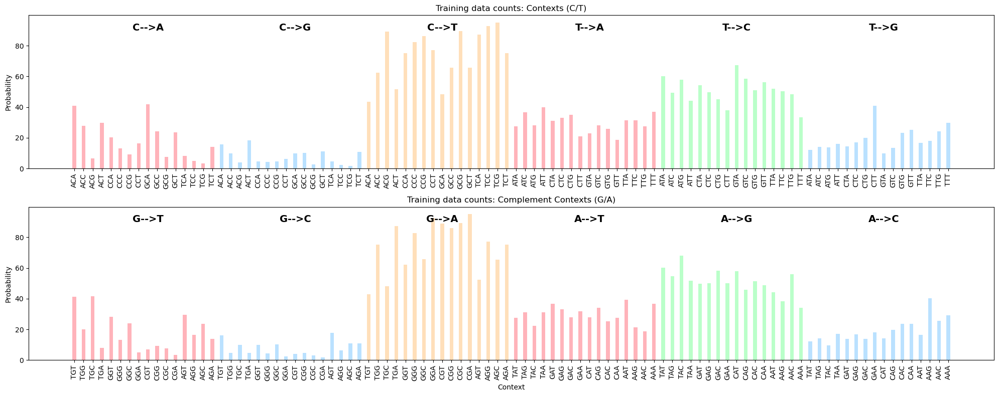

In [38]:
plot_reordered_df(observed_counts_train, "Training data counts", only_mutation=True)

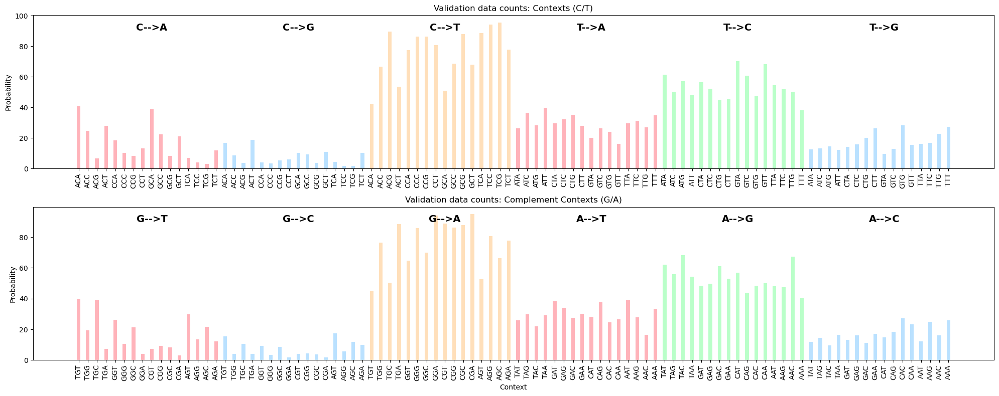

In [39]:
plot_reordered_df(observed_counts_val, "Validation data counts", only_mutation=True)

In [49]:
plot_reordered_df(predicted_probs, "Model prediction probabilities",only_mutation=True)

NameError: name 'plot_reordered_df' is not defined

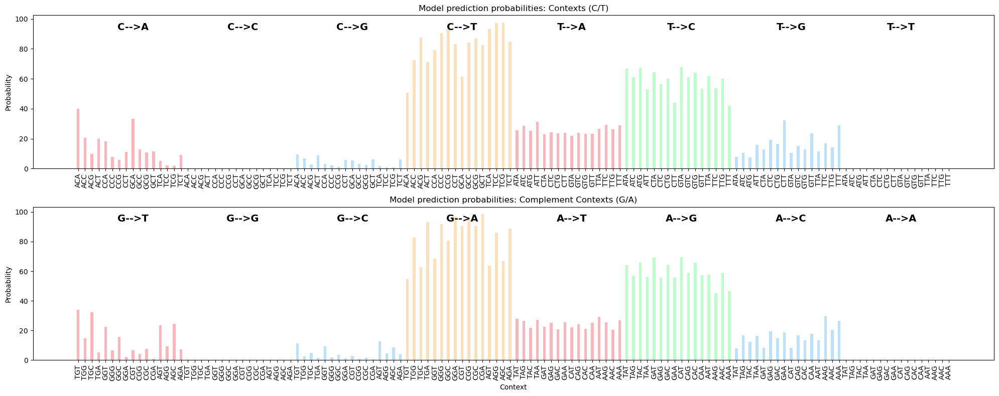

In [117]:
plot_reordered_df(predicted_probs, "Model prediction probabilities")

## Comparison Results (Main)

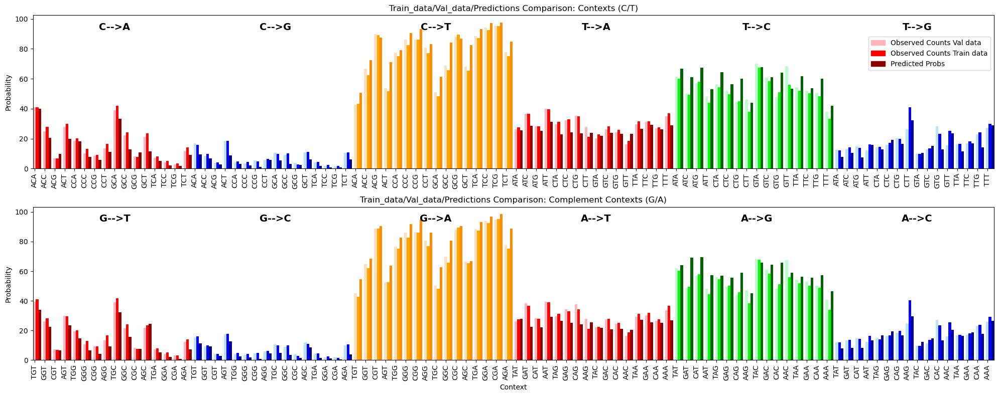

In [108]:
plot_reordered_df_multi(
    [observed_counts_val, observed_counts_train, predicted_probs],
    'Train_data/Val_data/Predictions Comparison',
    legend=['Observed Counts Val data', 'Observed Counts Train data', 'Predicted Probs'],
    only_mutation=True
)

In [56]:
predicted_probs__A = pd.read_csv('context_3/prediction_analysis/3_context_prediction_probs___model_A_1l6h12nembd.csv')
predicted_probs__A[['A','C','G','T']]= predicted_probs__A[['A','C','G','T']]*100
predicted_probs__A = predicted_probs__A[['Context', 'A', 'C', 'G', 'T']]

# Reset index and set 'Context' as the index
predicted_probs__A.set_index('Context', inplace=True)

# Add "Nucleotide" as the name for columns
predicted_probs__A.columns.name = 'Nucleotide'

# Save the second DataFrame to a CSV file without the index
predicted_probs__A.to_csv('../results/context_3/prediction_analysis/model_A_1l6h12nembd__predicted_context_probs.csv')

assert_mutations(predicted_probs__A)


 The maximum probability of a non-mutation prediction (i.e. A to A, as not found in the training data) is: 0.856 % 



In [57]:
predicted_probs__B = pd.read_csv('context_3/prediction_analysis/3_context_prediction_probs___model_B_1l1h12nembd.csv')
predicted_probs__B[['A','C','G','T']]= predicted_probs__B[['A','C','G','T']]*100
predicted_probs__B = predicted_probs__B[['Context', 'A', 'C', 'G', 'T']]

# Reset index and set 'Context' as the index
predicted_probs__B.set_index('Context', inplace=True)

# Add "Nucleotide" as the name for columns
predicted_probs__B.columns.name = 'Nucleotide'

# Save the second DataFrame to a CSV file without the index
predicted_probs__B.to_csv('../results/context_3/prediction_analysis/model_B_1l1h12nembd__predicted_context_probs.csv')

assert_mutations(predicted_probs__B)


 The maximum probability of a non-mutation prediction (i.e. A to A, as not found in the training data) is: 0.709 % 



In [58]:
predicted_probs__C = pd.read_csv('context_3/prediction_analysis/3_context_prediction_probs___model_C_6l6h12nembd.csv')
predicted_probs__C[['A','C','G','T']]= predicted_probs__C[['A','C','G','T']]*100
predicted_probs__C = predicted_probs__C[['Context', 'A', 'C', 'G', 'T']]

# Reset index and set 'Context' as the index
predicted_probs__C.set_index('Context', inplace=True)

# Add "Nucleotide" as the name for columns
predicted_probs__C.columns.name = 'Nucleotide'

# Save the second DataFrame to a CSV file without the index
predicted_probs__C.to_csv('../results/context_3/prediction_analysis/model_C_6l6h12nembd__predicted_context_probs.csv')

assert_mutations(predicted_probs__C)


 The maximum probability of a non-mutation prediction (i.e. A to A, as not found in the training data) is: 0.8049999999999999 % 



In [59]:
predicted_probs__D = pd.read_csv('context_3/prediction_analysis/3_context_prediction_probs___model_D_6l6h384nembd.csv')
predicted_probs__D[['A','C','G','T']]= predicted_probs__D[['A','C','G','T']]*100
predicted_probs__D = predicted_probs__D[['Context', 'A', 'C', 'G', 'T']]

# Reset index and set 'Context' as the index
predicted_probs__D.set_index('Context', inplace=True)

# Add "Nucleotide" as the name for columns
predicted_probs__D.columns.name = 'Nucleotide'

# Save the second DataFrame to a CSV file without the index
predicted_probs__D.to_csv('../results/context_3/prediction_analysis/model_D_6l6h384nembd__predicted_context_probs.csv')

assert_mutations(predicted_probs__D)


 The maximum probability of a non-mutation prediction (i.e. A to A, as not found in the training data) is: 0.093 % 



In [60]:
predicted_probs__E = pd.read_csv('context_3/prediction_analysis/3_context_prediction_probs___model_E_2l2h384nembd.csv')
predicted_probs__E[['A','C','G','T']]= predicted_probs__E[['A','C','G','T']]*100
predicted_probs__E = predicted_probs__E[['Context', 'A', 'C', 'G', 'T']]

# Reset index and set 'Context' as the index
predicted_probs__E.set_index('Context', inplace=True)

# Add "Nucleotide" as the name for columns
predicted_probs__E.columns.name = 'Nucleotide'

# Save the second DataFrame to a CSV file without the index
predicted_probs__E.to_csv('../results/context_3/prediction_analysis/model_E_2l2h384nembd__predicted_context_probs.csv')

assert_mutations(predicted_probs__E)


 The maximum probability of a non-mutation prediction (i.e. A to A, as not found in the training data) is: 0.033 % 



In [61]:
reorder_df(predicted_probs__E)

Nucleotide,A,C,G,T
Context,,,,
ACA,16.450,0.007,4.447,79.095
ACC,16.376,0.009,4.257,79.358
ACG,15.853,0.006,4.256,79.884
ACT,15.324,0.005,5.004,79.667
CCA,14.057,0.006,4.410,81.526
...,...,...,...,...
CAA,0.013,21.656,53.599,24.732
AAT,0.014,25.190,46.694,28.101
AAG,0.014,25.190,46.694,28.101


In [62]:
reorder_df(predicted_probs__A)
reorder_df(predicted_probs__B)
reorder_df(predicted_probs__C)
reorder_df(predicted_probs__D)

Nucleotide,A,C,G,T
Context,,,,
ACA,39.798,0.028,9.471,50.703
ACC,20.603,0.020,6.901,72.475
ACG,9.666,0.004,2.823,87.507
ACT,19.908,0.038,8.921,71.133
CCA,18.049,0.003,2.934,79.014
...,...,...,...,...
CAA,0.020,17.584,57.208,25.188
AAT,0.044,13.398,57.295,29.263
AAG,0.020,29.416,45.206,25.358


In [70]:
plot_reordered_df(predicted_probs__D, "Model prediction probabilities")

NameError: name 'plot_reordered_df' is not defined

In [71]:
plot_reordered_df_multi(
    [observed_counts_train, predicted_probs__D, predicted_probs__C],
    'Train_data/Val_data/Predictions Comparison',
    legend=['Observed Counts Train data', 'Predicted Probs 6l 6h dim384', 'Predicted Probs 6l 6h dim12'],
    only_mutation=True
)

NameError: name 'observed_counts_train' is not defined

In [119]:
plot_reordered_df_multi(
    [observed_counts_train, predicted_probs__A, predicted_probs__B],
    'Train_data/Val_data/Predictions Comparison',
    legend=['Observed Counts Train data', 'Predicted Probs 1l 6h dim12', 'Predicted Probs 1l 1h dim12'],
    only_mutation=True
)

NameError: name 'predicted_probs__A' is not defined

In [120]:
plot_reordered_df_multi(
    [observed_counts_train, predicted_probs__E],
    'Train_data/Predictions Comparison',
    legend=['Observed Counts Train data', 'Predicted Probabilities'],
    only_mutation=True
)

IndexError: string index out of range

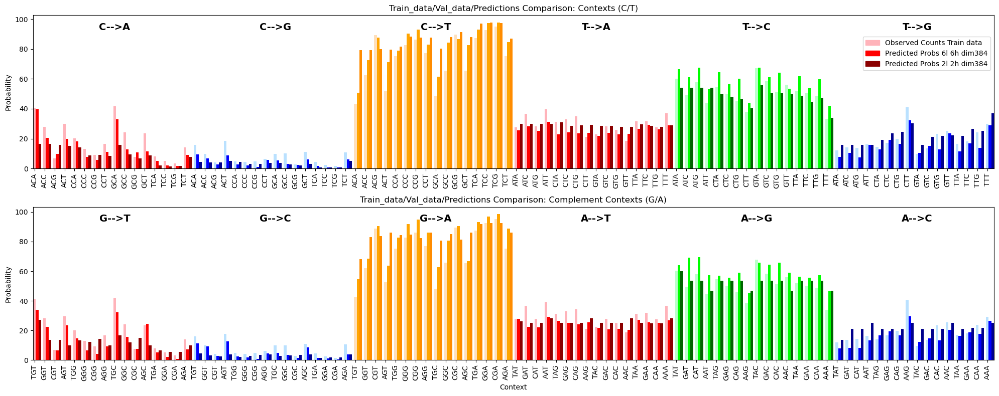

In [116]:
plot_reordered_df_multi(
    [observed_counts_train, predicted_probs__D, predicted_probs__E],
    'Train_data/Val_data/Predictions Comparison',
    legend=['Observed Counts Train data', 'Predicted Probs 6l 6h dim384', 'Predicted Probs 2l 2h dim384'],
    only_mutation=True
)

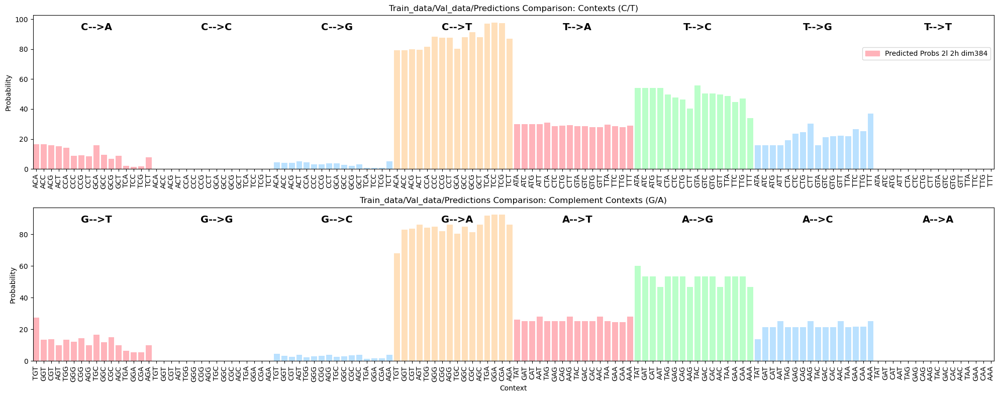

In [117]:
plot_reordered_df_multi(
    [ predicted_probs__E],
    'Train_data/Val_data/Predictions Comparison',
    legend=['Predicted Probs 2l 2h dim384'],
    only_mutation=False
)

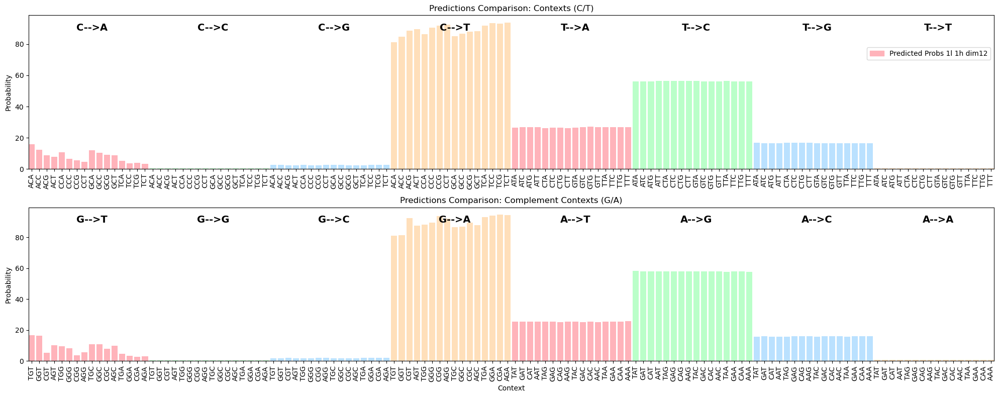

In [119]:
plot_reordered_df_multi(
    [ predicted_probs__B],
    'Predictions Comparison',
    legend=['Predicted Probs 1l 1h dim12'],
    only_mutation=False
)

## Accuracy rate 

In [2]:
results_H = pd.read_csv('architecture_2/context_3/embedding_analysis_model_H/results_model_H.csv')
# Function to calculate the percentage of each predicted letter for a given letter position
def calculate_percentage(df, letter_position):
    counts = df.groupby(letter_position)['predicted_mutation'].value_counts(normalize=True).unstack().fillna(0)
    counts = counts * 100  # Convert to percentage
    return counts

# Calculate the percentage of each predicted letter for the first, middle, and last positions
first_letter_stats = calculate_percentage(results_H, 'first_letter')
middle_letter_stats = calculate_percentage(results_H, 'middle_letter')
last_letter_stats = calculate_percentage(results_H, 'last_letter')
real_mutation_stats = calculate_percentage(results_H, 'actual_mutation')


# Display the results
print("First Letter Statistics:\n", first_letter_stats)
print("Middle Letter Statistics:\n", middle_letter_stats)
print("Last Letter Statistics:\n", last_letter_stats)
print("\n\n ACTUAL MUTATION Statistics:\n", real_mutation_stats)

# Save the results to CSV files
'''
first_letter_stats.to_csv('first_letter_stats.csv')
middle_letter_stats.to_csv('middle_letter_stats.csv')
last_letter_stats.to_csv('last_letter_stats.csv')
'''


First Letter Statistics:
 predicted_mutation          A          C          G          T
first_letter                                                  
A                   41.658900  16.961789  14.538677  26.840634
C                   25.361513  12.680756  10.678532  51.279199
G                   66.548358   8.606921   8.784383  16.060337
T                   27.196213   7.048922   8.890058  56.864808
Middle Letter Statistics:
 predicted_mutation          A          C          G          T
middle_letter                                                 
A                    0.000000  16.310976  53.506098  30.182927
C                    9.983897   0.000000   3.703704  86.312399
G                   84.779138   4.310804   0.000000  10.910059
T                   27.076412  56.312292  16.611296   0.000000
Last Letter Statistics:
 predicted_mutation          A          C          G          T
last_letter                                                   
A                   57.914240   7.676019

"\nfirst_letter_stats.to_csv('first_letter_stats.csv')\nmiddle_letter_stats.to_csv('middle_letter_stats.csv')\nlast_letter_stats.to_csv('last_letter_stats.csv')\n"

In [13]:

results_H.groupby('actual_mutation').value_counts()

actual_mutation  sample  first_letter  middle_letter  last_letter  predicted_mutation
A                0       T             G              A            A                     1
                 4       T             C              A            T                     1
                 7       G             G              A            A                     1
                 10      T             G              T            A                     1
                 11      C             G              A            A                     1
                                                                                        ..
T                4988    T             C              G            T                     1
                 4991    T             C              C            T                     1
                 4992    A             C              G            A                     1
                 4995    A             A              A            C                     1
    

In [22]:
print('A:',(results_H['actual_mutation']=='A').sum() / len(results_H) *100)
print('C:',(results_H['actual_mutation']=='C').sum() / len(results_H) *100)
print('G:',(results_H['actual_mutation']=='G').sum() / len(results_H) *100)
print('T:',(results_H['actual_mutation']=='T').sum() / len(results_H) *100)

A: 39.24
C: 10.74
G: 10.66
T: 39.36


In [5]:
import pandas as pd

# Function to concatenate first, middle, and last letters into a new column named 'context'
def add_context_column(df):
    df['context'] = df['first_letter'] + df['middle_letter'] + df['last_letter']
    return df

# Function to split the DataFrame into two DataFrames based on 'actual_mutation' and 'predicted_mutation'
def split_dataframe(df):
    actual_mutation_df = df[['context', 'actual_mutation']].copy()
    predicted_mutation_df = df[['context', 'predicted_mutation']].copy()
    return actual_mutation_df, predicted_mutation_df

# Function to calculate normalized counts of each letter for each context
def calculate_normalized_counts(df, mutation_column):
    counts = df.groupby('context')[mutation_column].value_counts(normalize=True).unstack().fillna(0)
    counts = counts * 100  # Convert to percentage
    return counts

# Read the results file
results_H = pd.read_csv('architecture_2/context_3/embedding_analysis_model_H/results_model_H.csv')

# Add the 'context' column
results_H = add_context_column(results_H)

# Split the DataFrame
actual_mutation_df, predicted_mutation_df = split_dataframe(results_H)

# Calculate normalized counts
actual_mutation_counts = calculate_normalized_counts(actual_mutation_df, 'actual_mutation')
predicted_mutation_counts = calculate_normalized_counts(predicted_mutation_df, 'predicted_mutation')

# Display the results
print("Actual Mutation Counts:\n", actual_mutation_counts)
print("\nPredicted Mutation Counts:\n", predicted_mutation_counts)

# Save the results to CSV files
actual_mutation_counts.to_csv('actual_mutation_counts.csv')
predicted_mutation_counts.to_csv('predicted_mutation_counts.csv')


Actual Mutation Counts:
 actual_mutation          A          C          G          T
context                                                    
AAA               0.000000  27.777778  42.592593  29.629630
AAC               0.000000  13.207547  73.584906  13.207547
AAG               0.000000  37.500000  39.285714  23.214286
AAT               0.000000   7.812500  51.562500  40.625000
ACA              41.379310   0.000000  17.241379  41.379310
...                    ...        ...        ...        ...
TGT              41.071429  17.857143   0.000000  41.071429
TTA              34.042553  55.319149  10.638298   0.000000
TTC              40.000000  42.857143  17.142857   0.000000
TTG              36.666667  43.333333  20.000000   0.000000
TTT              44.897959  22.448980  32.653061   0.000000

[64 rows x 4 columns]

Predicted Mutation Counts:
 predicted_mutation          A          C          G          T
context                                                       
AAA              

In [13]:
actual_mutation_counts.head(-10)

actual_mutation,A,C,G,T
context,,,,
AAA,0.000000,27.777778,42.592593,29.629630
AAC,0.000000,13.207547,73.584906,13.207547
AAG,0.000000,37.500000,39.285714,23.214286
AAT,0.000000,7.812500,51.562500,40.625000
ACA,41.379310,0.000000,17.241379,41.379310
ACC,22.388060,0.000000,11.940299,65.671642
ACG,8.571429,0.000000,8.571429,82.857143
ACT,32.812500,0.000000,18.750000,48.437500
AGA,74.074074,12.500000,0.000000,13.425926


In [14]:
predicted_mutation_counts.head(-10)

predicted_mutation,A,C,G,T
context,,,,
AAA,0.000000,22.222222,44.444444,33.333333
AAC,0.000000,13.207547,47.169811,39.622642
AAG,0.000000,14.285714,55.357143,30.357143
AAT,0.000000,25.000000,43.750000,31.250000
ACA,29.310345,0.000000,6.896552,63.793103
ACC,19.402985,0.000000,4.477612,76.119403
ACG,28.571429,0.000000,11.428571,60.000000
ACT,25.000000,0.000000,9.375000,65.625000
AGA,86.574074,5.092593,0.000000,8.333333


# New

### function

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
import numpy as np

def weighted_r2_score(y_true, y_pred, weights, exclude_zero=False):
    if exclude_zero:
        # Create a mask where both y_true and y_pred are >= 0.1
        mask = ~((y_true < 0.1) & (y_pred < 0.1))
        
        # Apply the mask to filter out the pairs
        y_true = y_true[mask]
        y_pred = y_pred[mask]
        weights = weights[mask]
        assert(len(y_true)==len(y_pred))
    #print(len(y_true))
    weighted_ssr = np.sum(weights * (y_true - y_pred) ** 2)
    weighted_sst = np.sum(weights * (y_true - np.average(y_true, weights=weights)) ** 2)
    
    return 1 - weighted_ssr / weighted_sst

def correlation_plot(csv_file1, csv_file2, labels, threshold=10, predictions=False, exclude_zero=False, plot=True):
    # Load CSV files into DataFrames
    df1 = pd.read_csv(csv_file1)
    df2 = pd.read_csv(csv_file2)
    
    # Derive context sizes from the lengths of the strings in the Context column
    context_size1 = len(df1['Context'].iloc[0])
    context_size2 = len(df2['Context'].iloc[0])
    
    # Ensure df1 is the one with the larger context size
    if context_size1 < context_size2:
        df1, df2 = df2, df1
        context_size1, context_size2 = context_size2, context_size1
    
    # Process df1
    if 'Context_Count_Absolute' in df1.columns: 
        df1 = df1[['Context', 'A', 'C', 'G', 'T', 'Context_Count_Absolute']].set_index('Context')
        df1 = df1[df1['Context_Count_Absolute'] >= threshold]
    else:
        df1 = df1[['Context', 'A', 'C', 'G', 'T']].set_index('Context')
    
    # Process df2
    if 'Context_Count_Absolute' in df2.columns: 
        df2 = df2[['Context', 'A', 'C', 'G', 'T', 'Context_Count_Absolute']].set_index('Context')
        df2 = df2[df2['Context_Count_Absolute'] >= threshold]
    else:
        df2 = df2[['Context', 'A', 'C', 'G', 'T']].set_index('Context')

    nucleotides = ['A', 'T', 'C', 'G']

    if predictions:
        for col in nucleotides:
            if (df1[col] <= 1).all():
                df1[col] *= 100 
            if (df2[col] <= 1).all():
                df2[col] *= 100  

    # Extract the middle context from df1 to match with df2
    middle_index = (context_size1 - context_size2) // 2
    df1['Middle_Context'] = df1.index.str[middle_index:middle_index + context_size2]

    # Merge the DataFrames on the Middle_Context of df1 and the Context of df2
    merged_df = df1.reset_index().merge(df2.reset_index(), left_on='Middle_Context', right_on='Context', suffixes=('_df1', '_df2')).set_index('Context_df1')
    
    # Calculate the relative context counts
    merged_df['Relative_Context_Count'] = merged_df['Context_Count_Absolute'] / merged_df['Context_Count_Absolute'].sum()

    # Calculate the weighted R² for all columns A, T, C, G combined
    x_all = merged_df[[f'{nucleotide}_df1' for nucleotide in nucleotides]].values.flatten()
    y_all = merged_df[[f'{nucleotide}_df2' for nucleotide in nucleotides]].values.flatten()
    weights_all = np.tile(merged_df['Relative_Context_Count'].values, len(nucleotides))
    
    overall_r2 = weighted_r2_score(x_all, y_all, weights_all,exclude_zero=exclude_zero)
    
    marker_size = 10 if context_size1 >= 5 else (50 if (context_size1 == 3 or context_size1 >= 15) else 100)
    
    # Plotting
    if plot:
        fig, axes = plt.subplots(1, 4, figsize=(21, 4))
        
        for i, nucleotide in enumerate(nucleotides):
            ax = axes[i]
            
            x = merged_df[f'{nucleotide}_df1']
            y = merged_df[f'{nucleotide}_df2']
            weights = merged_df['Relative_Context_Count'].values
            
            colors = merged_df['Context_Count_Absolute_df1'] if 'Context_Count_Absolute_df1' in merged_df.columns else merged_df['Context_Count_Absolute'] 
            
            scatter = ax.scatter(x, y, c=np.log1p(colors), cmap='viridis', alpha=0.7, s=marker_size)
            ax.plot([0, 100], [0, 100], 'k--', alpha=0.5)  # Dotted reference line x=y
            
            ax.set_xlim(0, 100)
            ax.set_ylim(0, 100)
            
            r2 = weighted_r2_score(x, y, weights,exclude_zero=exclude_zero)
            
            ax.set_xlabel(labels[0])
            ax.set_ylabel(labels[1])
            ax.set_title(f'{nucleotide}\nR² = {r2:.2f}')
        
            if context_size1 <= 3 or context_size1 >= 15:
                for context, (xi, yi) in merged_df[[f'{nucleotide}_df1', f'{nucleotide}_df2']].iterrows():
                    ax.text(xi, yi, context, fontsize=8, ha='right')
            
            ax.grid(True)
        
        legend_text = f'Context Size: {context_size1}\nOverall R²: {overall_r2:.2f}'
        axes[0].text(0.05, 0.95, legend_text, transform=axes[0].transAxes, fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
        
        plt.subplots_adjust(left=0.05, right=0.85, top=0.9, bottom=0.1, wspace=0.3)
        
        cbar_ax = fig.add_axes([0.87, 0.1, 0.01, 0.8])
        cbar = fig.colorbar(scatter, cax=cbar_ax)
        cbar.set_label('Mutation per context')
        
        cbar_ticks = cbar.get_ticks()
        rounded_ticks = [int(np.round(np.expm1(tick), -1)) for tick in cbar_ticks]
        cbar.set_ticks(cbar_ticks)
        cbar.set_ticklabels([f"{tick:.0e}".replace('+0', '') for tick in rounded_ticks])
    
        plt.show()
    return merged_df, overall_r2


### test vs prediction

In [9]:
csv_predictions1= '../results/all_results_by_model/model_A801___with_architecture1_context_1/prediction_probabilities_model_A801.csv'
csv_predictions3= '../results/all_results_by_model/model_A802___with_architecture1_context_3/prediction_probabilities_model_A802.csv'
csv_predictions5= '../results/all_results_by_model/model_A802___with_architecture1_context_5/prediction_probabilities_model_A802.csv'
csv_predictions7= '../results/all_results_by_model/model_A703___with_architecture1_context_7/prediction_probabilities_model_A703.csv'
csv_predictions9= '../results/all_results_by_model/model_A704___with_architecture1_context_9/prediction_probabilities_model_A704.csv'

main_path='../results/mutation_best_model_calc/test/test_data_n_gramms_size_'

In [10]:
df = pd.read_csv(f'{main_path}{context_size}.csv')
df[df['Context_Count_Absolute']>100]

NameError: name 'context_size' is not defined

In [6]:
#context_size=15
#correlation_plot(f'{main_path}{context_size}.csv', csv_predictions1,['Test','Prediction'], context_size, predictions=True)

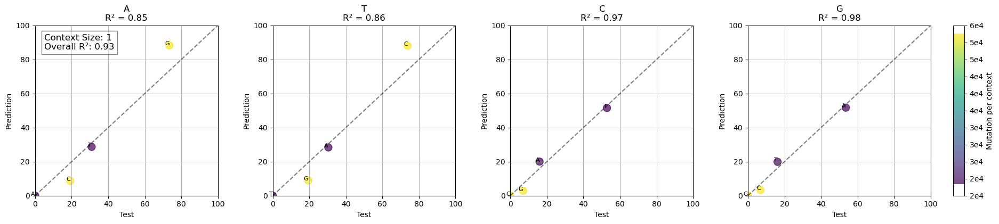

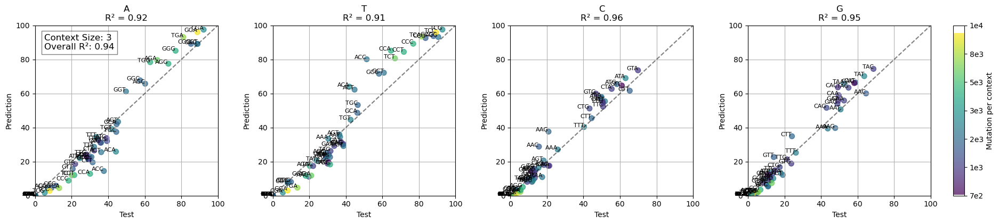

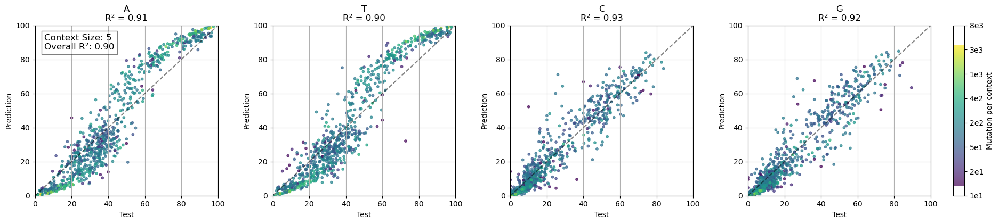

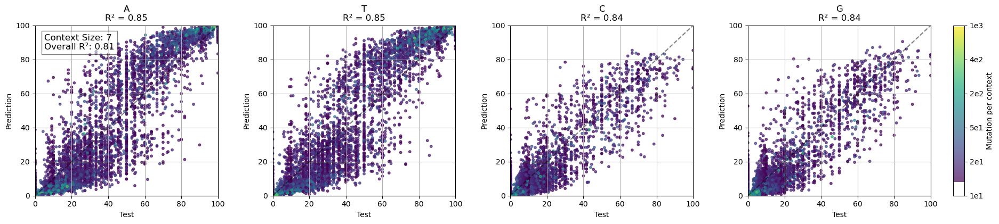

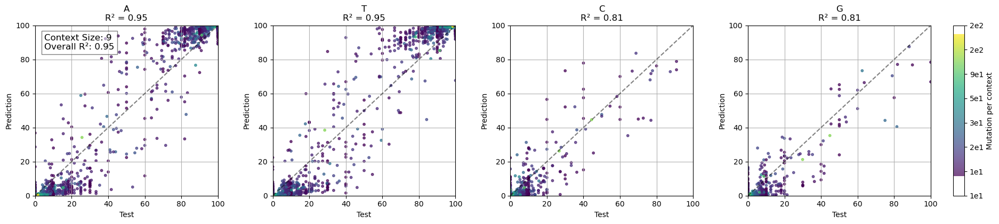

(                 A_df1      C_df1      G_df1      T_df1  \
 Context_df1                                               
 AAAAAAAAA     0.000000  26.724138  44.827586  28.448276   
 AAAAAAAAG     0.000000   3.703704  81.481481  14.814815   
 AAAAAAAAT     0.000000  20.000000  20.000000  60.000000   
 AAAAAAAGA     0.000000  23.076923  53.846154  23.076923   
 AAAAAAATA     0.000000  35.714286   7.142857  57.142857   
 ...                ...        ...        ...        ...   
 TTTTTAAAT    85.185185  11.111111   3.703704   0.000000   
 TTTTTAATT    69.230769  23.076923   7.692308   0.000000   
 TTTTTATTT    40.000000  30.000000  30.000000   0.000000   
 TTTTTCTTT     9.090909  90.909091   0.000000   0.000000   
 TTTTTTTTT    25.641026  44.444444  29.914530   0.000000   
 
              Context_Count_Absolute Middle_Context Context_df2   A_df2  \
 Context_df1                                                              
 AAAAAAAAA                       116      AAAAAAAAA   AAAAAAAAA   0.

In [11]:
context_size=1
_, r2= correlation_plot(f'{main_path}{context_size}.csv', csv_predictions1,['Test','Prediction'], predictions=True, threshold=10)

context_size=3
correlation_plot(f'{main_path}{context_size}.csv', csv_predictions3,['Test','Prediction'], predictions=True, threshold=10)

context_size=5
correlation_plot(f'{main_path}{context_size}.csv', csv_predictions5,['Test','Prediction'], predictions=True, threshold=10)

context_size=7
df=correlation_plot(f'{main_path}{context_size}.csv', csv_predictions7,['Test','Prediction'], predictions=True, threshold=10)

context_size=9
correlation_plot(f'{main_path}{context_size}.csv', csv_predictions9,['Test','Prediction'], predictions=True, threshold=10)

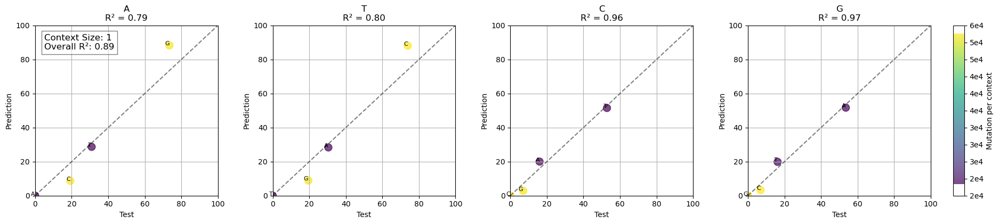

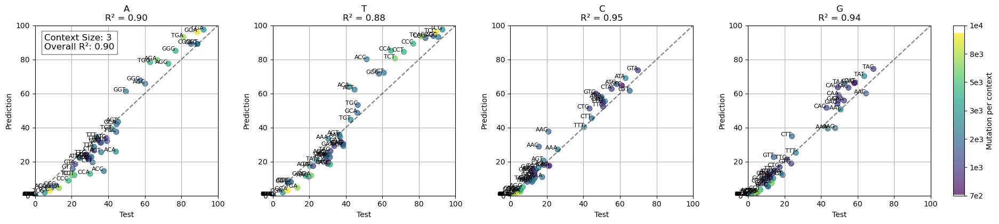

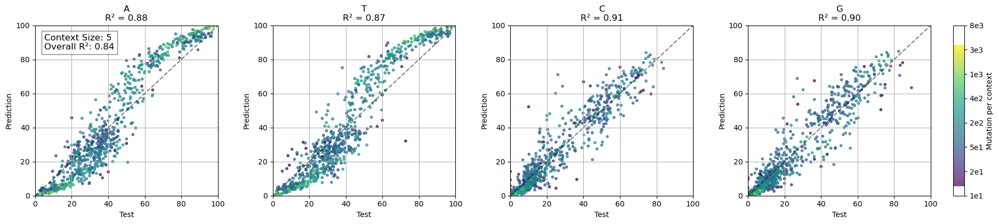

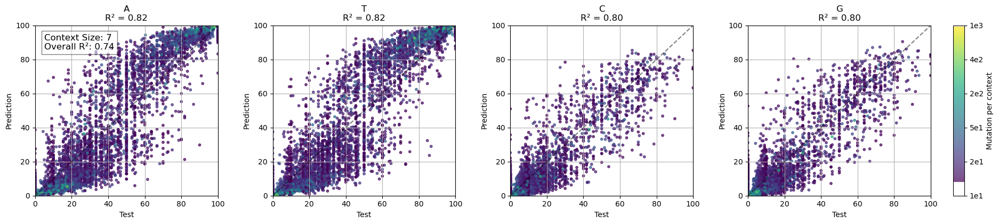

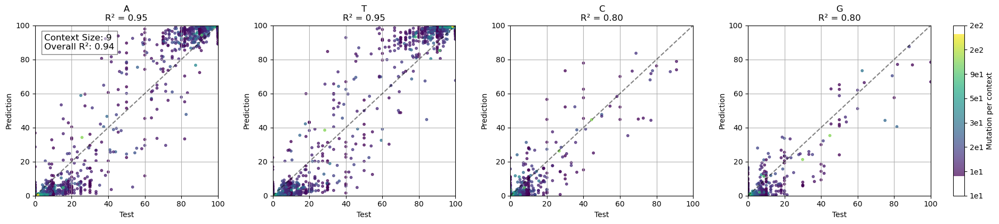

   context_size  r2_with0  r2_without0
0             1   0.89762     0.888164
1             3   0.89762     0.902075
2             5   0.89762     0.839761
3             7   0.89762     0.741307
4             9   0.89762     0.938194


In [15]:
context_sizes = [1, 3, 5, 7,9]
results = []

for context_size in context_sizes:
    csv_file = f'{main_path}{context_size}.csv'
    #_, r2_with0    = correlation_plot(csv_file, eval(f'csv_predictions{context_size}'), ['Test', 'Prediction'], threshold=10, predictions=True, exclude_zero=False)
    _, r2_without0 = correlation_plot(csv_file, eval(f'csv_predictions{context_size}'), ['Test', 'Prediction'], threshold=10, predictions=True, exclude_zero=True, plot=True)
    results.append({'context_size': context_size, 'r2_with0': r2_with0,'r2_without0': r2_without0})

r2_df = pd.DataFrame(results)

print(r2_df)

### comparing different context sizes

In [ ]:
results = []

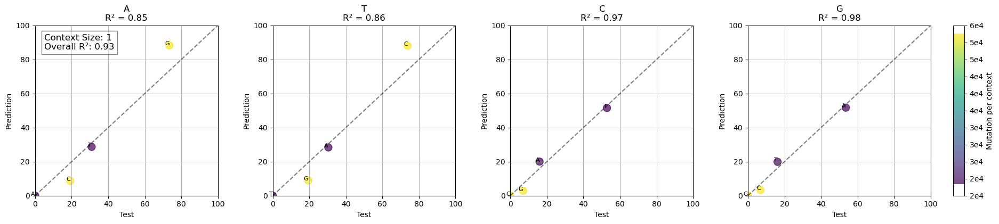

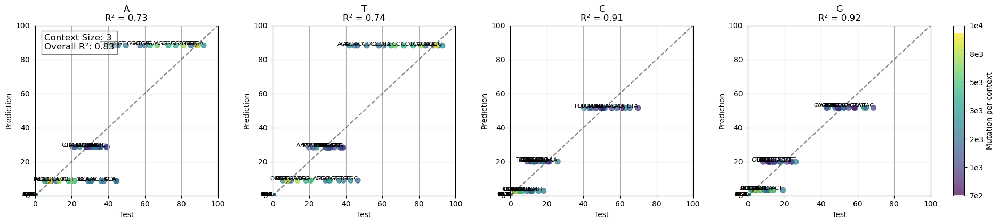

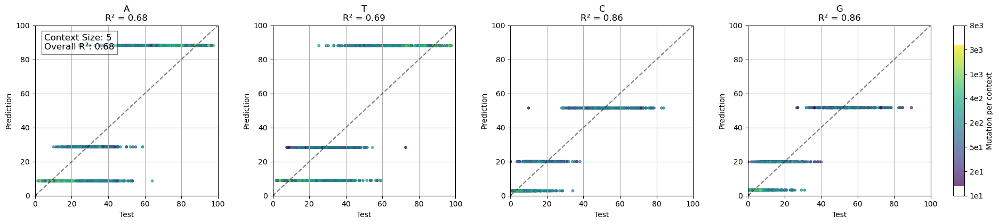

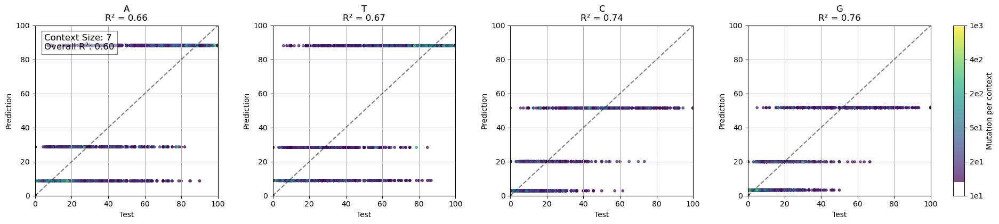

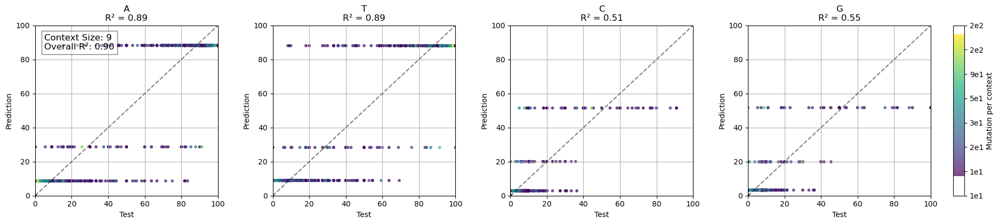

   context_size  r2_1_pred_with0  r2_without0  r2_3_pred_with0  \
0             1         0.926362     0.888164              NaN   
1             3              NaN     0.738598         0.828118   
2             5              NaN     0.502220              NaN   
3             7              NaN     0.455682              NaN   
4             9              NaN     0.878922              NaN   
5             1         0.926362          NaN              NaN   
6             3         0.828118          NaN              NaN   
7             5         0.675153          NaN              NaN   
8             7         0.598515          NaN              NaN   
9             9         0.897620          NaN              NaN   

   r2_5_pred_with0  r2_7_pred_with0  r2_9_pred_with0  r2_1_pred_without0  
0              NaN              NaN              NaN                 NaN  
1              NaN              NaN              NaN                 NaN  
2         0.675153              NaN             

In [35]:
context_sizes = [1, 3, 5, 7,9]

for context_size in context_sizes:
    csv_file = f'{main_path}{context_size}.csv'
    _, r2_with0 = correlation_plot(csv_file, csv_predictions1, ['Test', 'Prediction'], threshold=10, predictions=True, exclude_zero=False)
    _, r2_without0 = correlation_plot(csv_file, csv_predictions1, ['Test', 'Prediction'], threshold=10, predictions=True, exclude_zero=True, plot=False)
    results.append({'context_size': context_size, 'r2_1_pred_with0': r2_with0,'r2_1_pred_without0': r2_without0})

r2_df = pd.DataFrame(results)

print(r2_df)

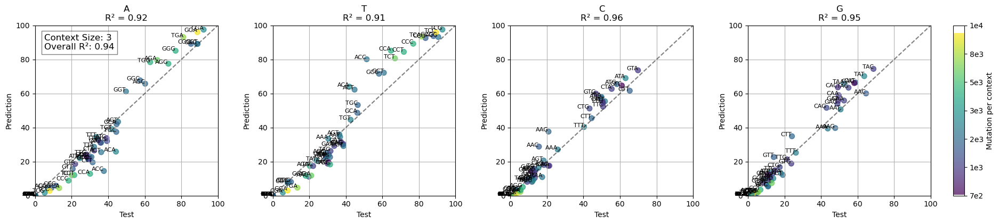

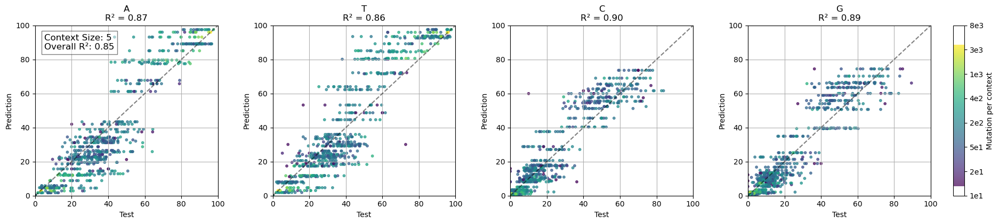

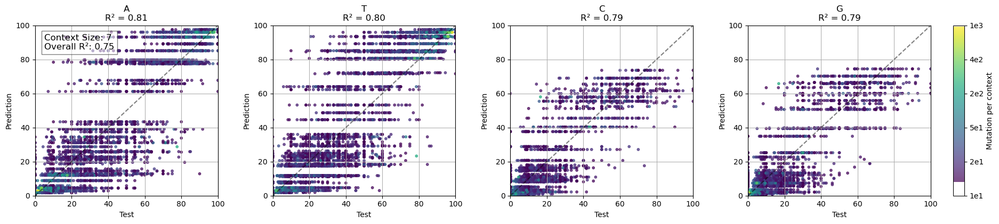

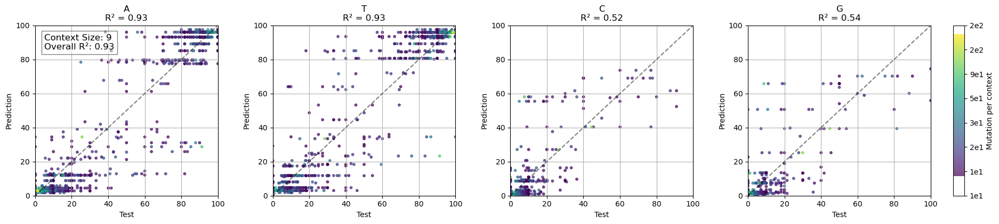

    context_size  r2_1_pred_with0  r2_without0  r2_3_pred_with0  \
0              1         0.926362     0.888164              NaN   
1              3              NaN     0.738598         0.828118   
2              5              NaN     0.502220              NaN   
3              7              NaN     0.455682              NaN   
4              9              NaN     0.878922              NaN   
5              1         0.926362          NaN              NaN   
6              3         0.828118          NaN              NaN   
7              5         0.675153          NaN              NaN   
8              7         0.598515          NaN              NaN   
9              9         0.897620          NaN              NaN   
10             3              NaN          NaN         0.935611   
11             5              NaN          NaN         0.854150   
12             7              NaN          NaN         0.754073   
13             9              NaN          NaN         0.92818

In [36]:
context_sizes = [3, 5, 7,9]

for context_size in context_sizes:
    csv_file = f'{main_path}{context_size}.csv'
    _, r2_with0 = correlation_plot(csv_file, csv_predictions3, ['Test', 'Prediction'], threshold=10, predictions=True, exclude_zero=False)
    _, r2_without0 = correlation_plot(csv_file, csv_predictions3, ['Test', 'Prediction'], threshold=10, predictions=True, exclude_zero=True, plot=False)
    results.append({'context_size': context_size, 'r2_3_pred_with0': r2_with0,'r2_3_pred_without0': r2_without0})

r2_df = pd.DataFrame(results)

print(r2_df)

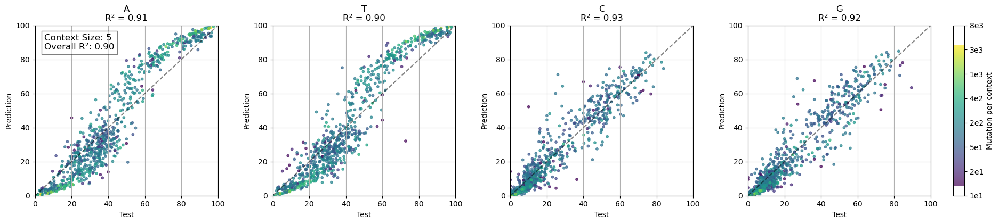

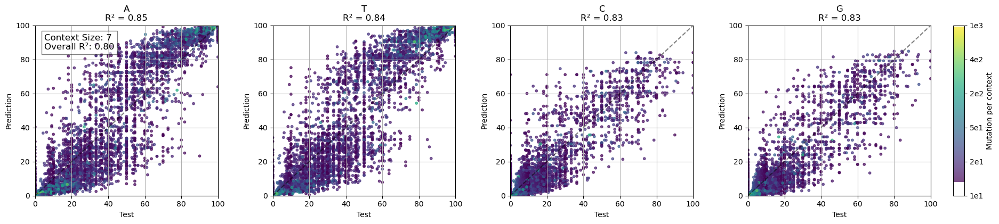

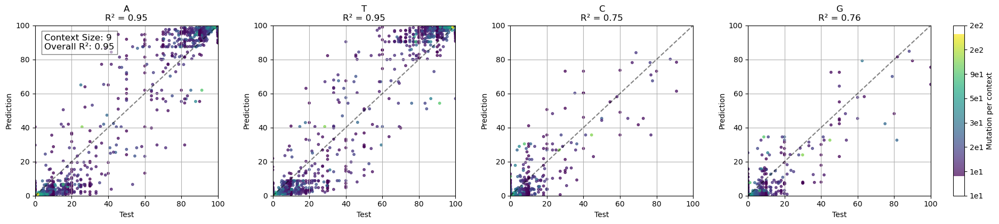

    context_size  r2_1_pred_with0  r2_without0  r2_3_pred_with0  \
0              1         0.926362     0.888164              NaN   
1              3              NaN     0.738598         0.828118   
2              5              NaN     0.502220              NaN   
3              7              NaN     0.455682              NaN   
4              9              NaN     0.878922              NaN   
5              1         0.926362          NaN              NaN   
6              3         0.828118          NaN              NaN   
7              5         0.675153          NaN              NaN   
8              7         0.598515          NaN              NaN   
9              9         0.897620          NaN              NaN   
10             3              NaN          NaN         0.935611   
11             5              NaN          NaN         0.854150   
12             7              NaN          NaN         0.754073   
13             9              NaN          NaN         0.92818

In [37]:
context_sizes = [5, 7,9]

for context_size in context_sizes:
    csv_file = f'{main_path}{context_size}.csv'
    _, r2_with0 = correlation_plot(csv_file, csv_predictions5, ['Test', 'Prediction'], threshold=10, predictions=True, exclude_zero=False)
    _, r2_without0 = correlation_plot(csv_file, csv_predictions5, ['Test', 'Prediction'], threshold=10, predictions=True, exclude_zero=True, plot=False)
    results.append({'context_size': context_size, 'r2_5_pred_with0': r2_with0,'r2_5_pred_without0': r2_without0})

r2_df = pd.DataFrame(results)

print(r2_df)

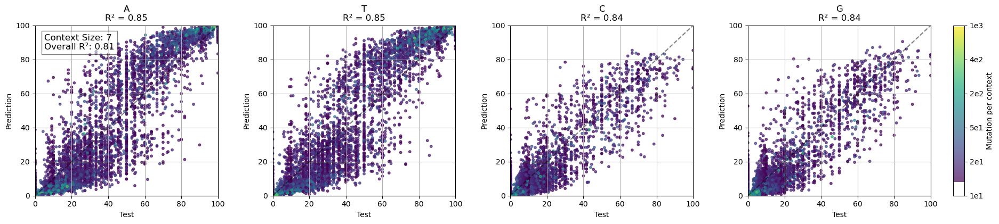

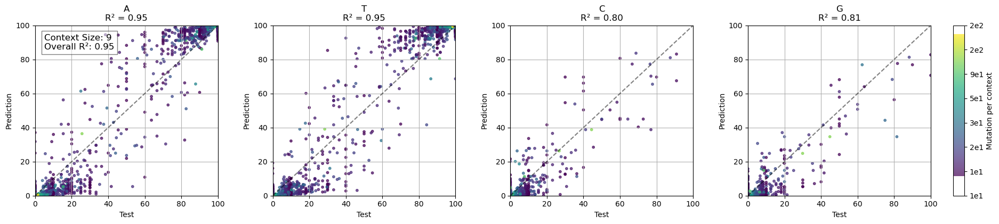

    context_size  r2_1_pred_with0  r2_without0  r2_3_pred_with0  \
0              1         0.926362     0.888164              NaN   
1              3              NaN     0.738598         0.828118   
2              5              NaN     0.502220              NaN   
3              7              NaN     0.455682              NaN   
4              9              NaN     0.878922              NaN   
5              1         0.926362          NaN              NaN   
6              3         0.828118          NaN              NaN   
7              5         0.675153          NaN              NaN   
8              7         0.598515          NaN              NaN   
9              9         0.897620          NaN              NaN   
10             3              NaN          NaN         0.935611   
11             5              NaN          NaN         0.854150   
12             7              NaN          NaN         0.754073   
13             9              NaN          NaN         0.92818

In [38]:
context_sizes = [7,9]

for context_size in context_sizes:
    csv_file = f'{main_path}{context_size}.csv'
    _, r2_with0 = correlation_plot(csv_file, csv_predictions7, ['Test', 'Prediction'], threshold=10, predictions=True, exclude_zero=False)
    _, r2_without0 = correlation_plot(csv_file, csv_predictions7, ['Test', 'Prediction'], threshold=10, predictions=True, exclude_zero=True, plot=False)
    results.append({'context_size': context_size, 'r2_7_pred_with0': r2_with0,'r2_7_pred_without0': r2_without0})

r2_df = pd.DataFrame(results)

print(r2_df)

In [55]:
r2_df_grouped = r2_df.groupby('context_size', as_index=False).mean()
r2_df_grouped = r2_df_grouped.drop(columns=['r2_without0'])

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

r2_df_grouped=r2_df_grouped[r2_df_grouped['context_size']<9]

# Filter columns
with0_columns =    [col for col in r2_df_grouped.columns if 'with0'    in col]
without0_columns = [col for col in r2_df_grouped.columns if 'without0' in col]

label_mapping = {
    'r2_1_pred_with0': 'Context size 1 model',
    'r2_3_pred_with0': 'Context size 3 model',
    'r2_5_pred_with0': 'Context size 5 model',
    'r2_7_pred_with0': 'Context size 7 model',
    'r2_9_pred_with0': 'Context size 9 model',
    'r2_1_pred_without0': 'Context size 1 model',
    'r2_3_pred_without0': 'Context size 3 model',
    'r2_5_pred_without0': 'Context size 5 model',
    'r2_7_pred_without0': 'Context size 7 model',
    'r2_9_pred_without0': 'Context size 9 model',
}


# Plotting
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Plotting "with0" columns
for col in with0_columns:
    axes[0].plot(r2_df_grouped['context_size'], r2_df_grouped[col], marker='o', label=label_mapping.get(col, col))

axes[0].set_title('Including non-mutation predictions')
axes[0].set_xlabel('Context Size')
axes[0].set_ylabel('R²')
axes[0].legend()
axes[0].grid(True)

# Plotting "without0" columns
for col in without0_columns:
    axes[1].plot(r2_df_grouped['context_size'], r2_df_grouped[col], marker='o', label=label_mapping.get(col, col))

axes[1].set_title('Excluding non-mutation predictions')
axes[1].set_xlabel('Context Size')
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()
plt.show()


NameError: name 'r2_df_grouped' is not defined

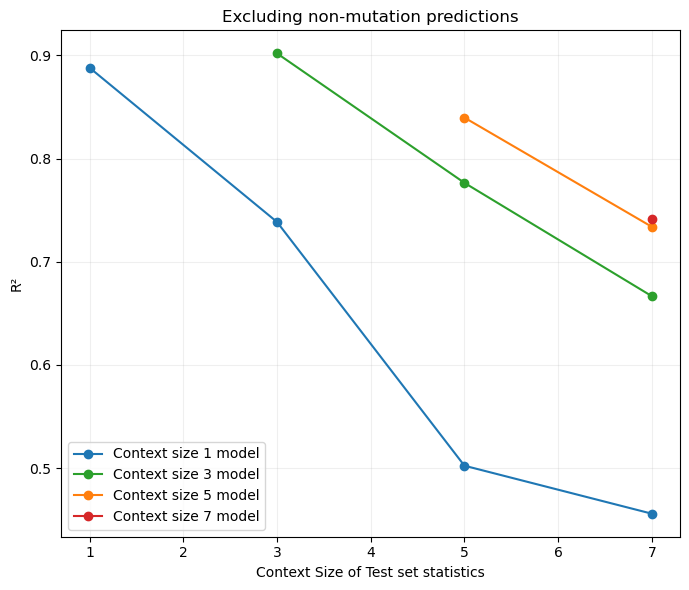

In [67]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter the DataFrame to exclude context_size >= 9
r2_df_grouped = r2_df_grouped[r2_df_grouped['context_size'] < 9]

# Filter columns for "without0"
without0_columns = [col for col in r2_df_grouped.columns if 'without0' in col]

label_mapping = {
    'r2_1_pred_without0': 'Context size 1 model',
    'r2_3_pred_without0': 'Context size 3 model',
    'r2_5_pred_without0': 'Context size 5 model',
    'r2_7_pred_without0': 'Context size 7 model',
    'r2_9_pred_without0': 'Context size 9 model',
}

# Define a darker color palette
darker_colors = ['#1f77b4', '#2ca02c', '#ff7f0e', '#d62728', '#9467bd']  # Dark blue, dark green, dark orange, dark red, dark purple
#darker_colors = ['#0d3a66', '#1a542e', '#8b4500', '#a61b1b', '#5e2d7f']  
# Plotting
fig, ax = plt.subplots(figsize=(7, 6))  # Adjust size if needed

# Plotting "without0" columns with darker colors
for i, col in enumerate(without0_columns):
    ax.plot(r2_df_grouped['context_size'], r2_df_grouped[col], marker='o', label=label_mapping.get(col, col), color=darker_colors[i % len(darker_colors)])

ax.set_title('Explained variation Excluding non-mutation predictions')
ax.set_xlabel('Context Size of Test set statistics')
ax.set_ylabel('R²')
ax.legend()
ax.grid(True,alpha=0.2)

plt.tight_layout()
plt.show()


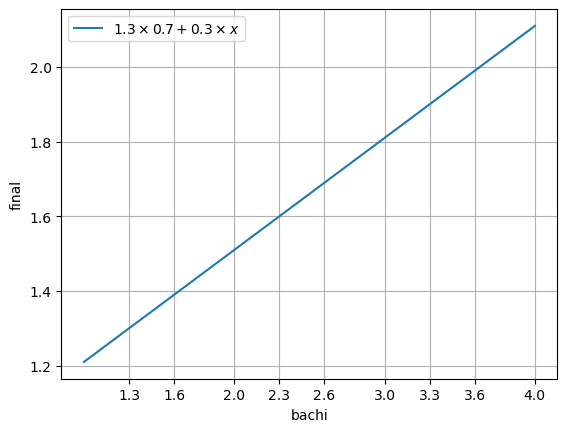

In [69]:
import matplotlib.pyplot as plt
import numpy as np

# Define the range for x
x = np.linspace(1.0, 4.0, 100)

# Define the function
y = 1.3 * 0.7 + 0.3 * x

# Plot the function
plt.plot(x, y, label=r'$1.3 \times 0.7 + 0.3 \times x$')

# Define the specific ticks
ticks = [1.3, 1.6, 2.0, 2.3, 2.6, 3.0, 3.3, 3.6, 4.0]

# Set the ticks on the x-axis
plt.xticks(ticks)

# Set labels and title
plt.xlabel('bachi')
plt.ylabel('final')

# Show the grid
plt.grid(True)

# Display the legend
plt.legend()

# Show the plot
plt.show()


### train vs prediction

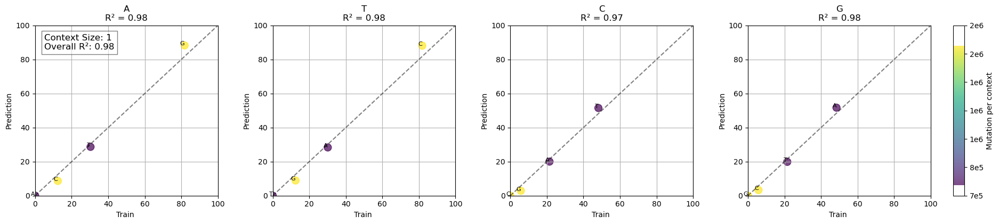

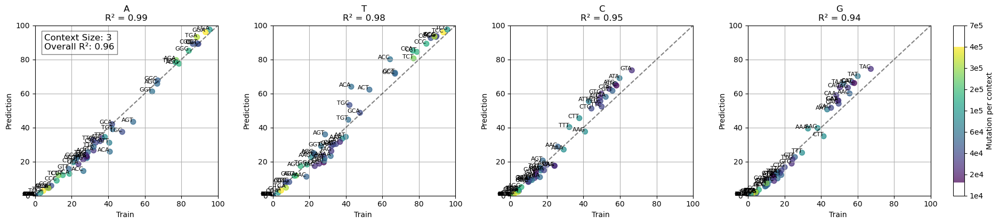

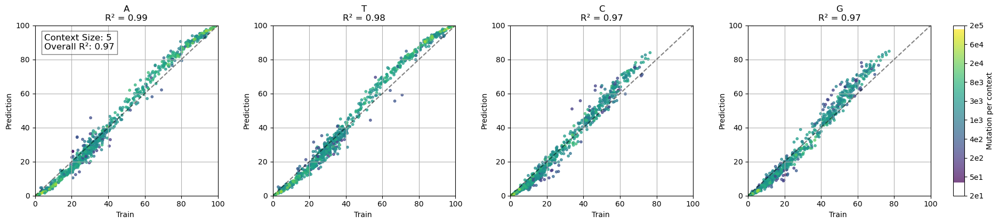

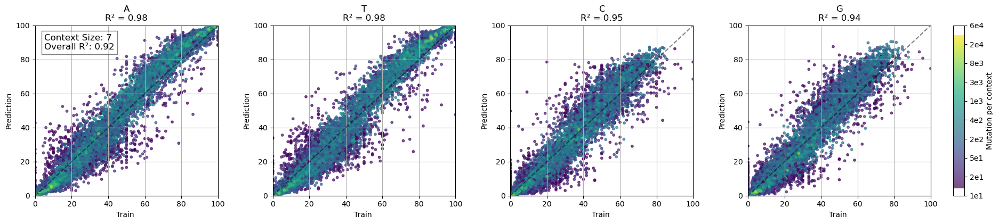

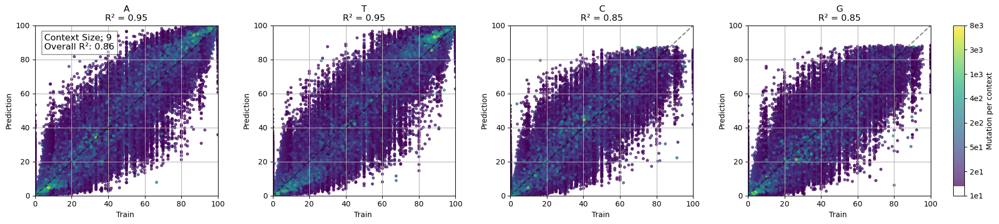

(                 A_df1      C_df1      G_df1      T_df1  \
 Context_df1                                               
 AAAAAAAAA     0.000000  24.347826  45.333333  30.318841   
 AAAAAAAAC     0.000000  30.612245  30.612245  38.775510   
 AAAAAAAAG     0.000000  12.253521  68.169014  19.577465   
 AAAAAAAAT     0.000000  30.627306  28.966790  40.405904   
 AAAAAAACA     0.000000  39.790576  25.130890  35.078534   
 ...                ...        ...        ...        ...   
 TTTTTTTGT    29.901961  24.019608  46.078431   0.000000   
 TTTTTTTTA    42.750929  28.252788  28.996283   0.000000   
 TTTTTTTTC    31.978320  40.108401  27.913279   0.000000   
 TTTTTTTTG    27.777778  30.701754  41.520468   0.000000   
 TTTTTTTTT    33.210219  40.381656  26.408126   0.000000   
 
              Context_Count_Absolute Middle_Context Context_df2   A_df2  \
 Context_df1                                                              
 AAAAAAAAA                      3450      AAAAAAAAA   AAAAAAAAA   0.

In [21]:
context_size=1
csv_file1 = f'../results/mutation_best_model_calc/train/train_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/all_results_by_model/model_A801___with_architecture1_context_1/prediction_probabilities_model_A801.csv'
correlation_plot(csv_file1, csv_file2,['Train ','Prediction'], 10,predictions=True,exclude_zero=True)
context_size=3
csv_file1 = f'../results/mutation_best_model_calc/train/train_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/all_results_by_model/model_A802___with_architecture1_context_{context_size}/prediction_probabilities_model_A802.csv'
correlation_plot(csv_file1, csv_file2,['Train ','Prediction'], 10,predictions=True,exclude_zero=True)
context_size=5
csv_file1 = f'../results/mutation_best_model_calc/train/train_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/all_results_by_model/model_A802___with_architecture1_context_{context_size}/prediction_probabilities_model_A802.csv'
correlation_plot(csv_file1, csv_file2,['Train ','Prediction'], 10,predictions=True,exclude_zero=True)
context_size=7
csv_file1 = f'../results/mutation_best_model_calc/train/train_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/all_results_by_model/model_A703___with_architecture1_context_{context_size}/prediction_probabilities_model_A703.csv'
correlation_plot(csv_file1, csv_file2,['Train ','Prediction'], 10,predictions=True,exclude_zero=True)
context_size=9
csv_file1 = f'../results/mutation_best_model_calc/train/train_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/all_results_by_model/model_A704___with_architecture1_context_{context_size}/prediction_probabilities_model_A704.csv'
correlation_plot(csv_file1, csv_file2,['Train ','Prediction'], 10,predictions=True,exclude_zero=True)
#context_size=15
#csv_file1 = f'../results/mutation_best_model_calc/test/test_data_n_gramms_size_{context_size}.csv'
#csv_file2 = f'../results/all_results_by_model/model_A801___with_architecture1_context_1/prediction_probabilities_model_A801.csv'
#correlation_plot(csv_file1, csv_file2,context_size,predictions=True)


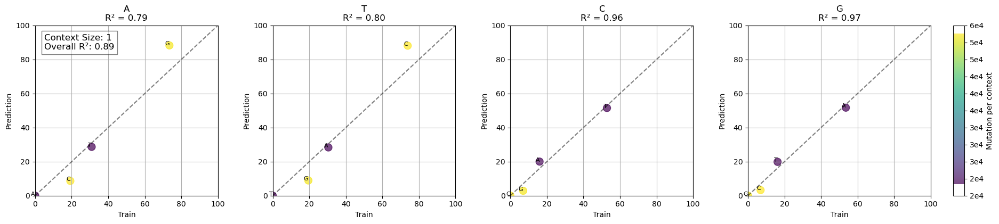

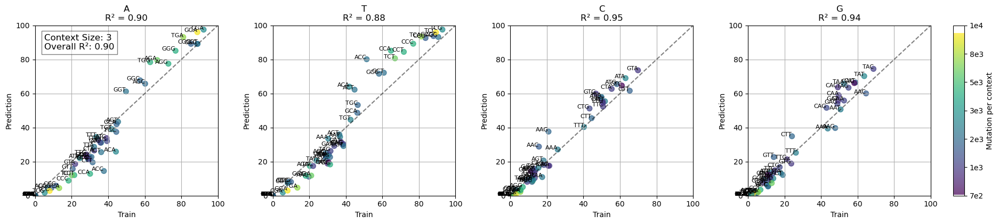

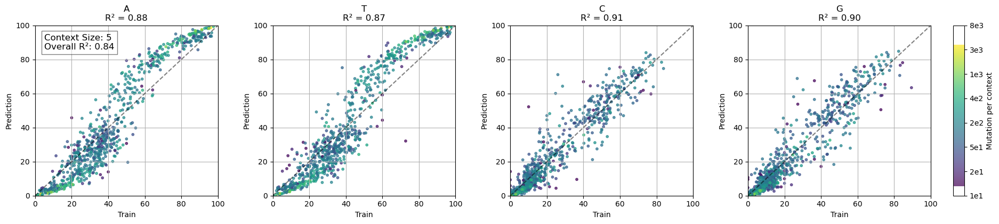

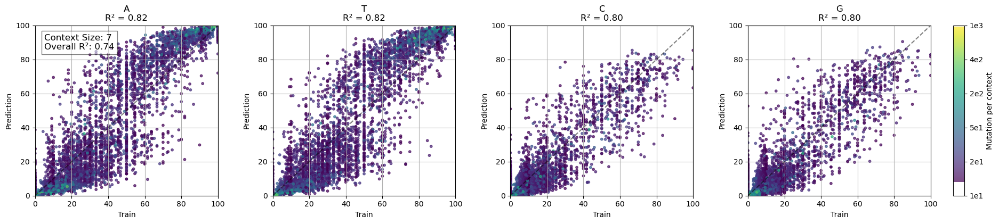

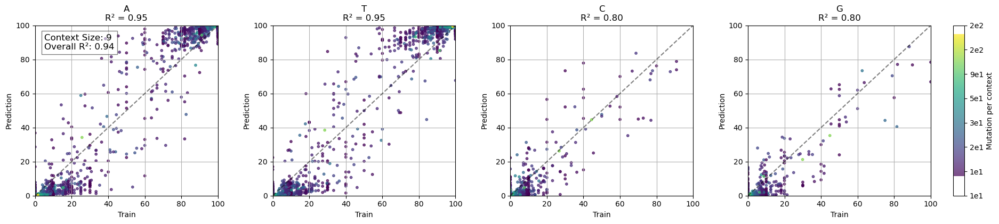

Empty DataFrame
Columns: []
Index: []


In [18]:
context_sizes = [1, 3, 5, 7,9]
results = []

for context_size in context_sizes:
    csv_file = f'{main_path}{context_size}.csv'
    #_, r2_with0    = correlation_plot(csv_file, eval(f'csv_predictions{context_size}'), ['Test', 'Prediction'], threshold=10, predictions=True, exclude_zero=False)
    _, r2_without0 = correlation_plot(csv_file, eval(f'csv_predictions{context_size}'), ['Train', 'Prediction'], threshold=10, predictions=True, exclude_zero=True, plot=True)
    #results.append({'context_size': context_size, 'r2_with0': r2_with0,'r2_without0': r2_without0})

r2_df = pd.DataFrame(results)

print(r2_df)

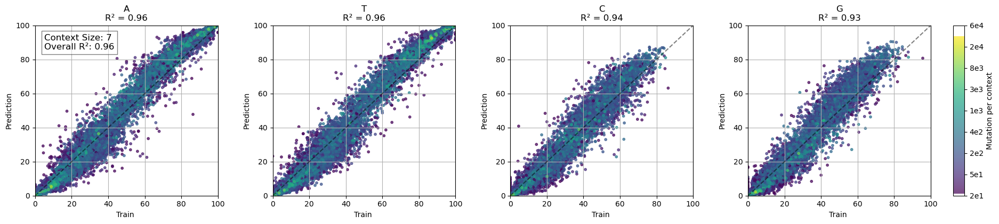

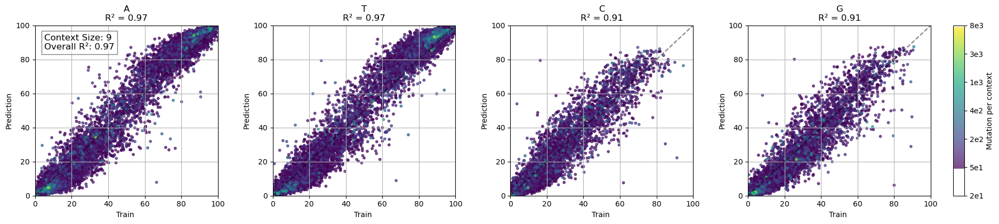

In [189]:
context_size=7
csv_file1 = f'../results/mutation_best_model_calc/train/train_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/all_results_by_model/model_A703___with_architecture1_context_{context_size}/prediction_probabilities_model_A703.csv'
correlation_plot(csv_file1, csv_file2,['Train ','Prediction'], context_size,predictions=True, threshold=20)
context_size=9
csv_file1 = f'../results/mutation_best_model_calc/train/train_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/all_results_by_model/model_A704___with_architecture1_context_{context_size}/prediction_probabilities_model_A704.csv'
correlation_plot(csv_file1, csv_file2,['Train ','Prediction'], context_size,predictions=True, threshold=50)
#context_size=15

### test vs train

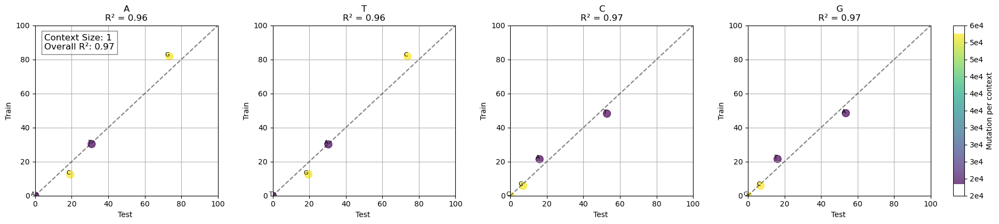

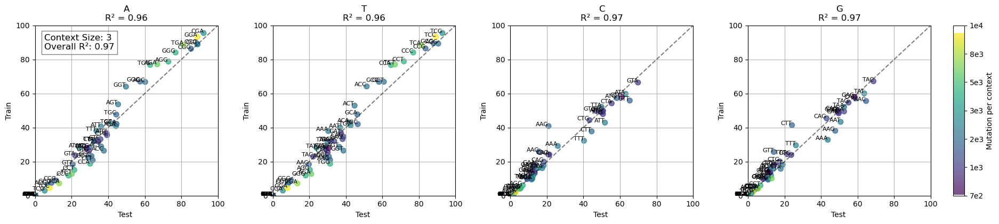

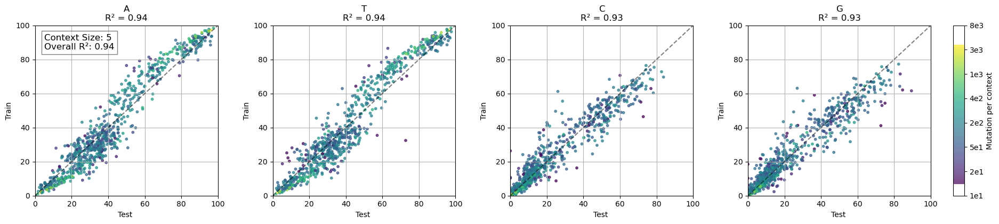

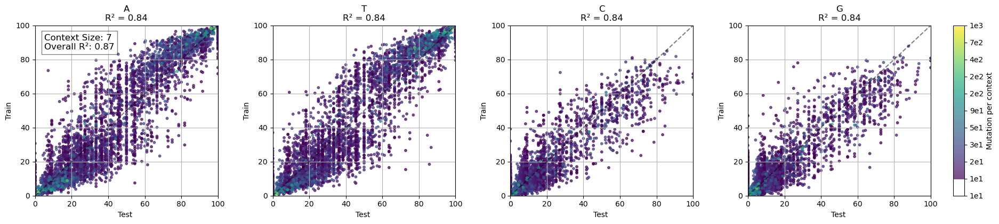

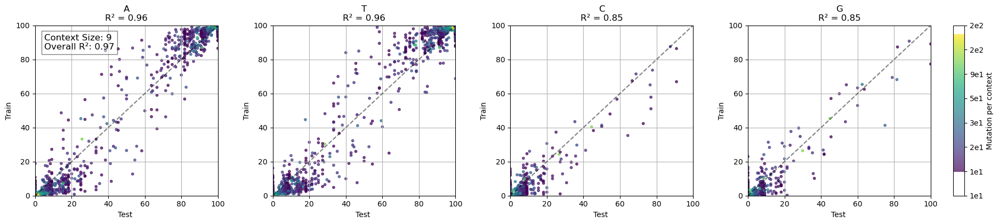

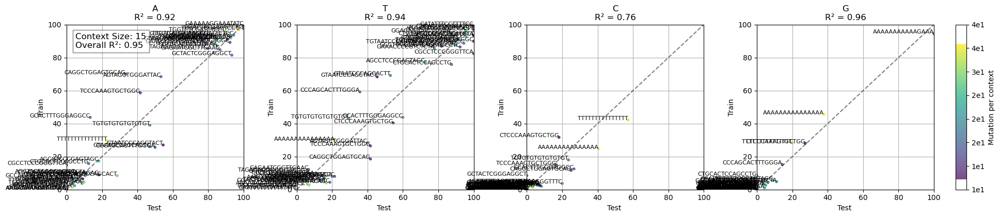

In [190]:
context_size=1
csv_file1 = f'../results/mutation_best_model_calc/test/test_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/mutation_best_model_calc/train/train_data_n_gramms_size_{context_size}.csv'
correlation_plot(csv_file1, csv_file2,['Test ','Train'], context_size)
context_size=3
csv_file1 = f'../results/mutation_best_model_calc/test/test_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/mutation_best_model_calc/train/train_data_n_gramms_size_{context_size}.csv'
correlation_plot(csv_file1, csv_file2,['Test ','Train'],context_size)
context_size=5
csv_file1 = f'../results/mutation_best_model_calc/test/test_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/mutation_best_model_calc/train/train_data_n_gramms_size_{context_size}.csv'
correlation_plot(csv_file1, csv_file2,['Test ','Train'],context_size)
context_size=7
csv_file1 = f'../results/mutation_best_model_calc/test/test_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/mutation_best_model_calc/train/train_data_n_gramms_size_{context_size}.csv'
correlation_plot(csv_file1, csv_file2,['Test ','Train'],context_size)
context_size=9
csv_file1 = f'../results/mutation_best_model_calc/test/test_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/mutation_best_model_calc/train/train_data_n_gramms_size_{context_size}.csv'
correlation_plot(csv_file1, csv_file2,['Test ','Train'],context_size)
context_size=15
csv_file1 = f'../results/mutation_best_model_calc/test/test_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/mutation_best_model_calc/train/train_data_n_gramms_size_{context_size}.csv'
correlation_plot(csv_file1, csv_file2,['Test ','Train'],context_size)

## 2nd base pred

In [3]:
def extended_accuracy(csv_file1, csv_file2, labels, context_size, threshold=10, predictions=False, top_n=1):
    df1 = pd.read_csv(csv_file1)
    df2 = pd.read_csv(csv_file2)
    if 'Context_Count_Absolute' in df1.columns: 
        df1 = df1[['Context', 'A', 'C', 'G', 'T', 'Context_Count_Absolute']].set_index('Context')
        df1 = df1[df1['Context_Count_Absolute'] > threshold]
    else:
        df1 = df1[['Context', 'A', 'C', 'G', 'T']].set_index('Context')
    if 'Context_Count_Absolute' in df2.columns: 
        df2 = df2[['Context', 'A', 'C', 'G', 'T', 'Context_Count_Absolute']].set_index('Context')
        df2 = df2[df2['Context_Count_Absolute'] > threshold]
    else:
        df2 = df2[['Context', 'A', 'C', 'G', 'T']].set_index('Context')
   
    nucleotides = ['A', 'T', 'C', 'G']
    if predictions:
        for col in nucleotides:
            if (df1[col] <= 1).all():
                df1[col] *= 100 
            if (df2[col] <= 1).all():
                df2[col] *= 100  
    
    shared_contexts = df1.index.intersection(df2.index)
    df1 = df1.loc[shared_contexts]
    df2 = df2.loc[shared_contexts]
    merged_df = df1.join(df2, lsuffix='_df1', rsuffix='_df2')
    
    def get_ranked_nucleotides(row, suffix):
        return sorted(nucleotides, key=lambda x: row[f'{x}_{suffix}'], reverse=True)

    merged_df['ranked_df1'] = merged_df.apply(lambda row: get_ranked_nucleotides(row, 'df1'), axis=1)
    merged_df['ranked_df2'] = merged_df.apply(lambda row: get_ranked_nucleotides(row, 'df2'), axis=1)
    
    merged_df['1st base match']= merged_df['ranked_df1'].str[0]==merged_df['ranked_df2'].str[0]
    merged_df['2nd base match']= merged_df['ranked_df1'].str[1]==merged_df['ranked_df2'].str[1]
    merged_df['3rd base match']= merged_df['ranked_df1'].str[2]==merged_df['ranked_df2'].str[2]
    #merged_df['4th base match']= merged_df['ranked_df1'].str[3]==merged_df['ranked_df2'].str[3]

    first_match_perc=sum(merged_df['1st base match'])/len(merged_df)*100
    second_match_perc=sum(merged_df['2nd base match'])/len(merged_df)*100
    third_match_perc=sum(merged_df['3rd base match'])/len(merged_df)*100
    #fourth_match_perc=sum(merged_df['4th base match'])/len(merged_df)*100

    print(context_size, ':', first_match_perc,second_match_perc,third_match_perc)
    
    return merged_df

In [4]:
context_size=1
csv_file1 = f'../results/mutation_best_model_calc/test/test_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/all_results_by_model/model_A801___with_architecture1_context_1/prediction_probabilities_model_A801.csv'
df=extended_accuracy(csv_file1, csv_file2,['Test','Prediction'],context_size,predictions=True,top_n=2)
context_size=3
csv_file1 = f'../results/mutation_best_model_calc/test/test_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/all_results_by_model/model_A802___with_architecture1_context_{context_size}/prediction_probabilities_model_A802.csv'
df=extended_accuracy(csv_file1, csv_file2,['Test','Prediction'],context_size,predictions=True,top_n=1)
context_size=5
csv_file1 = f'../results/mutation_best_model_calc/test/test_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/all_results_by_model/model_A802___with_architecture1_context_{context_size}/prediction_probabilities_model_A802.csv'
df=extended_accuracy(csv_file1, csv_file2,['Test','Prediction'],context_size,predictions=True)
context_size=7
csv_file1 = f'../results/mutation_best_model_calc/test/test_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/all_results_by_model/model_A703___with_architecture1_context_{context_size}/prediction_probabilities_model_A703.csv'
df=extended_accuracy(csv_file1, csv_file2,['Test','Prediction'],context_size,predictions=True)
context_size=9
csv_file1 = f'../results/mutation_best_model_calc/test/test_data_n_gramms_size_{context_size}.csv'
csv_file2 = f'../results/all_results_by_model/model_A704___with_architecture1_context_{context_size}/prediction_probabilities_model_A704.csv'
df=extended_accuracy(csv_file1, csv_file2,['Test','Prediction'],context_size,predictions=True)

1 : 100.0 100.0 100.0
3 : 98.4375 92.1875 93.75
5 : 87.81985670419652 77.78915046059366 85.46571136131014
7 : 85.54050952490245 73.67454670644939 70.80560018361258
9 : 96.6829268292683 85.7560975609756 56.975609756097555


In [5]:
df[df['1st base match']==False].head(20)

,A_df1,C_df1,G_df1,T_df1,Context_Count_Absolute,A_df2,C_df2,G_df2,T_df2,ranked_df1,ranked_df2,1st base match,2nd base match,3rd base match
Context,,,,,,,,,,,,,,
AAAAAAAAA,0.000000,26.724138,44.827586,28.448276,116,0.002,26.232,35.299,38.467,"[G, T, C, A]","[T, G, C, A]",False,False,True
AAAAAAATT,0.000000,25.000000,41.666667,33.333333,12,0.003,31.344,17.378,51.275,"[G, T, C, A]","[T, C, G, A]",False,False,False
AAAACCAAA,60.000000,0.000000,6.666667,33.333333,15,29.513,0.001,10.868,59.618,"[A, T, G, C]","[T, A, G, C]",False,False,True
AAAAGATAT,36.363636,9.090909,0.000000,54.545455,11,80.607,6.934,0.000,12.458,"[T, A, C, G]","[A, T, C, G]",False,False,True
AAAAGTTTT,27.272727,9.090909,0.000000,63.636364,11,59.623,10.161,0.000,30.216,"[T, A, C, G]","[A, T, C, G]",False,False,True
AATACAAAA,31.250000,0.000000,25.000000,43.750000,16,51.563,0.004,13.543,34.889,"[T, A, G, C]","[A, T, G, C]",False,False,True
AATGGAGAA,38.461538,15.384615,0.000000,46.153846,13,92.175,3.035,0.000,4.791,"[T, A, C, G]","[A, T, C, G]",False,False,True
AGACCAGCC,54.545455,0.000000,0.000000,45.454545,22,25.162,0.000,5.363,69.475,"[A, T, C, G]","[T, A, G, C]",False,False,False
AGCACTTTG,50.000000,0.000000,10.000000,40.000000,20,24.450,0.001,13.113,62.436,"[A, T, G, C]","[T, A, G, C]",False,False,True


In [89]:
df[df['2nd base match']==False].head(20)

,A_df1,C_df1,G_df1,T_df1,Context_Count_Absolute,A_df2,C_df2,G_df2,T_df2,ranked_df1,ranked_df2,1st base match,2nd base match,3rd base match,4th base match
Context,,,,,,,,,,,,,,,
AAC,0.000000,15.631131,64.617397,19.751472,1529,0.007,28.806,60.037,11.149,"[G, T, C, A]","[G, C, T, A]",True,False,False,True
AAG,0.000000,20.886076,47.756041,31.357883,1738,0.008,37.619,39.733,22.639,"[G, T, C, A]","[G, C, T, A]",True,False,False,True
ACA,44.211774,0.000000,13.868036,41.920190,2531,25.861,0.005,10.127,64.006,"[A, T, G, C]","[T, A, G, C]",False,False,True,True
CTT,31.466513,44.457275,24.076212,0.000000,1732,19.576,45.516,34.898,0.010,"[C, A, G, T]","[C, G, A, T]",True,False,False,True
GTT,20.557276,65.325077,14.117647,0.000000,1615,15.703,61.622,22.670,0.006,"[C, A, G, T]","[C, G, A, T]",True,False,False,True


In [87]:
df[df['3rd base match']==False].head(20)

,A_df1,C_df1,G_df1,T_df1,Context_Count_Absolute,A_df2,C_df2,G_df2,T_df2,ranked_df1,ranked_df2,1st base match,2nd base match,3rd base match,4th base match
Context,,,,,,,,,,,,,,,
AAC,0.000000,15.631131,64.617397,19.751472,1529,0.007,28.806,60.037,11.149,"[G, T, C, A]","[G, C, T, A]",True,False,False,True
AAG,0.000000,20.886076,47.756041,31.357883,1738,0.008,37.619,39.733,22.639,"[G, T, C, A]","[G, C, T, A]",True,False,False,True
CTT,31.466513,44.457275,24.076212,0.000000,1732,19.576,45.516,34.898,0.010,"[C, A, G, T]","[C, G, A, T]",True,False,False,True
GTT,20.557276,65.325077,14.117647,0.000000,1615,15.703,61.622,22.670,0.006,"[C, A, G, T]","[C, G, A, T]",True,False,False,True


## Perplexity on test

In [22]:
import numpy as np
import pandas as pd

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the context sizes
cont_sizes = [2, 4 ,6 ,8 ,10 ,12, 14, 16, 20, 32, 64, 128, 256, 512, 1024 ,0 ,2048, 4096, 8192 ,16384]

# Initialize lists to store results
losses = []
perplexities = []
valid_context_sizes = []

# Function to calculate cross-entropy loss
def calculate_loss(row):
    predicted_prob = row[row['Target']]
    return -np.log(predicted_prob)

# Loop through each model
for i in range(1, 20):
    if i <= 9:
        data = pd.read_csv(f'../results/all_results_by_model/model_Z20{i}___with_architecture0_context_{cont_sizes[i-1]}/prediction_probabilities_model_Z20{i}.csv')
    elif cont_sizes[i-1] == 0:
        continue
    else:
        data = pd.read_csv(f'../results/all_results_by_model/model_Z2{i}___with_architecture0_context_{cont_sizes[i-1]}/prediction_probabilities_model_Z2{i}.csv')
    
    df = pd.DataFrame(data)

    # Apply the function to each row to calculate the loss
    df['loss'] = df.apply(calculate_loss, axis=1)
    
    # Calculate the average loss and perplexity
    average_loss = df['loss'].mean()
    perplexity = np.exp(average_loss)
    
    # Store results
    losses.append(average_loss)
    perplexities.append(perplexity)
    valid_context_sizes.append(cont_sizes[i-1])
    
    # Output the results
    print(f"Context Size: {cont_sizes[i-1]} - Average Loss (Cross-Entropy): {average_loss}, Perplexity: {perplexity}")


Context Size: 2 - Average Loss (Cross-Entropy): 1.3525703465200851, Perplexity: 3.867353204301192
Context Size: 4 - Average Loss (Cross-Entropy): 1.3352936817089445, Perplexity: 3.8011120996116623
Context Size: 6 - Average Loss (Cross-Entropy): 1.3006608297143343, Perplexity: 3.671722249247852
Context Size: 8 - Average Loss (Cross-Entropy): 1.232441424521288, Perplexity: 3.429592414486527
Context Size: 10 - Average Loss (Cross-Entropy): 1.1650115372370935, Perplexity: 3.2059598709085892
Context Size: 12 - Average Loss (Cross-Entropy): 1.0964404921712205, Perplexity: 2.993491680440292
Context Size: 14 - Average Loss (Cross-Entropy): 1.0587166707769748, Perplexity: 2.88266920084362
Context Size: 16 - Average Loss (Cross-Entropy): 1.0458461948840176, Perplexity: 2.8458056112246695
Context Size: 20 - Average Loss (Cross-Entropy): 0.9954068662976788, Perplexity: 2.705825026359078
Context Size: 32 - Average Loss (Cross-Entropy): 0.9431650230960595, Perplexity: 2.5680966543240005
Context Size

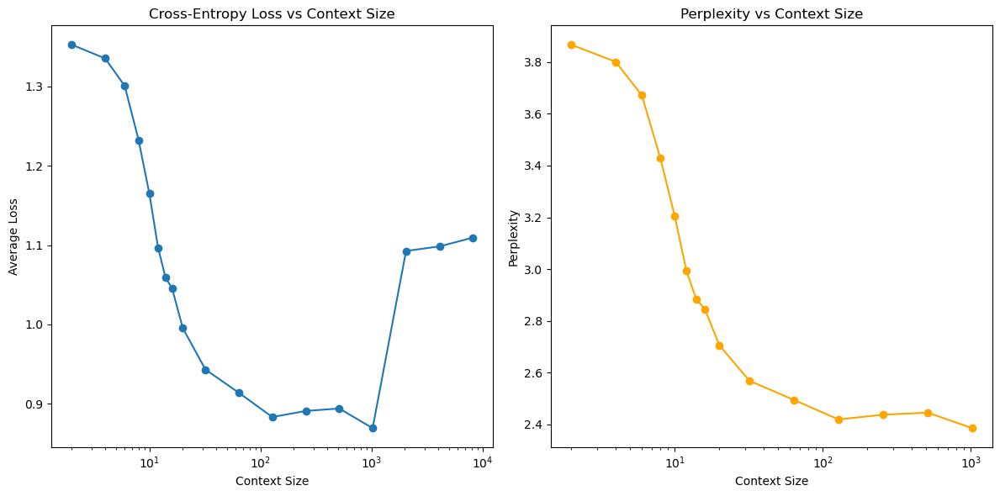

In [29]:
# Plotting the loss and perplexity
plt.figure(figsize=(12, 6))

# Plot for loss
plt.subplot(1, 2, 1)
plt.plot(valid_context_sizes, losses, marker='o')
plt.title('Cross-Entropy Loss vs Context Size')
plt.xlabel('Context Size')
plt.ylabel('Average Loss')
plt.xscale('log')

# Plot for perplexity
plt.subplot(1, 2, 2)
plt.plot(valid_context_sizes[:-3], perplexities[:-3], marker='o', color='orange')
plt.title('Perplexity vs Context Size')
plt.xlabel('Context Size')
plt.ylabel('Perplexity')
plt.xscale('log')

plt.tight_layout()
plt.show()

In [18]:
df

,Context,A,C,G,T,Target,loss
0,TTAGAAGAACTATTTCTTTCTTTTTTTTTTTTTTTTTTTTTTTTTT...,0.03890,0.78282,0.02653,0.15176,C,0.244852
1,CCAAAAGAACCTGAGGGATAATTTTAGGTGATAAACCCTGGCCAAT...,0.07728,0.28938,0.48085,0.15249,T,1.880656
2,AGTTTGTTCATCTTTGCACCGATACCAAATTGTCTTCATTACCATA...,0.29471,0.12142,0.12382,0.46004,T,0.776442
3,AAAATCCCATGTCATCTTTCCCAAGTTGTAGTGGGTTCCAACTTGT...,0.05900,0.88448,0.02249,0.03403,C,0.122755
4,TCCCACTGGCGGCAGGGCCTGCTGCCTGATCTGGGGGTGGGGTGGG...,0.48938,0.01649,0.46333,0.03080,A,0.714616
...,...,...,...,...,...,...,...
9995,GTGATCCTCCCACCTTGGCCTCCCAAAGTGCTAGGATTACAGGCAT...,0.15634,0.35231,0.35231,0.13905,C,1.043244
9996,TTGAAACATCGTTGCATTCCAGGAATAAATCCCACTTGGTCATGGT...,0.26149,0.42113,0.05995,0.25743,T,1.357007
9997,ACACTATTTTGTAGTCAATTGCAAGAGTAATAAAGCAAAATTATTG...,0.00724,0.11142,0.00493,0.87641,T,0.131921
9998,ACAGTCCCATCACCTGGGTGATCAGTGCAGAATTATGTCACAATGC...,0.29502,0.19807,0.28595,0.22096,G,1.251938
